# Outlet Gage Selection

In [1]:
# IMPORTS
import os

os.chdir('C:\\Users\\kondris\\Documents\\GitHub\\HighMagFlows_EPA_Project')

import pandas as pd 
import numpy as np
import seaborn as sns
import geopandas as gpd
#import pygeos
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily as cx
import requests
import calendar
from importlib import reload
import mapclassify as mc
from dataretrieval import nwis

from datetime import datetime, timedelta
from shapely.geometry import Point
from io import StringIO
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Patch
from matplotlib_scalebar.scalebar import ScaleBar

# Custom modules are imported in multiple locations to faciliate easy reloading when edits are made to their respective files
import Src.classes as cl
import Src.func_ko as fn
reload(cl)
reload(fn)

<module 'Src.func_ko' from 'C:\\Users\\kondris\\Documents\\GitHub\\HighMagFlows_EPA_Project\\Src\\func_ko.py'>

In [4]:
# gpd.show_versions()
# print(f"pygeos version: {pygeos.__version__}")
# print(f"geos version: {pygeos.geos_version}")
# gpd.options.use_pygeos = True
# print(f"use pygeos? {gpd.options.use_pygeos}")

In [5]:
#gpd.sjoin_nearest(gpd.GeoDataFrame(geometry=[]), gpd.GeoDataFrame(geometry=[]))

## Import gages (valid only with site names)

In [2]:
# Dataset upload
data_paths = {
    '30_90': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_90.xlsx',
    '50_90': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_90.xlsx',
    '30_95': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_95.xlsx',
    '50_95': 'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_95.xlsx'    
}

#dfs_metrics = {key: pd.read_excel(path, sheet_name='site_metrics') for key, path in data_paths.items()}
dfs_valid = {key: pd.read_excel(path) for key, path in data_paths.items()}

In [3]:
# Converts site_no to strings
date_ranges = ['30', '50']
percentiles = ['90', '95']
for date_range in date_ranges:
    for percentile in percentiles: 
        # Assuming df is your DataFrame and 'column_name' is the name of the column with numbers
        dfs_valid[f'{date_range}_{percentile}']['site_no'] = dfs_valid[f'{date_range}_{percentile}']['site_no'].astype(str)  # Convert numbers to strings

        # Add leading '0' to numbers with 7 digits
        dfs_valid[f'{date_range}_{percentile}']['site_no'] = dfs_valid[f'{date_range}_{percentile}']['site_no'].apply(lambda x: '0' + x if len(x) == 7 else x)

In [4]:
# Number of valid gages
date_ranges = ['30', '50']
percentiles = ['90', '95']
for date_range in date_ranges:
    for percentile in percentiles: 
        df_length = dfs_valid[f'{date_range}_{percentile}']
        print(f'{date_range}-Year gages (valid = True): {len(df_length)}')

30-Year gages (valid = True): 4242
30-Year gages (valid = True): 4242
50-Year gages (valid = True): 3314
50-Year gages (valid = True): 3314


## Import gages (valid and invalid)

In [7]:
# Dataset upload
data_paths = {
    '30_90': 'Prelim_Data/National_Metrics/National_Metrics_30_90.xlsx',
    '50_90': 'Prelim_Data/National_Metrics/National_Metrics_50_90.xlsx',
    '30_95': 'Prelim_Data/National_Metrics/National_Metrics_30_95.xlsx',
    '50_95': 'Prelim_Data/National_Metrics/National_Metrics_50_95.xlsx'    
}

#dfs_metrics = {key: pd.read_excel(path, sheet_name='site_metrics') for key, path in data_paths.items()}
dfs_metrics = {key: pd.read_excel(path) for key, path in data_paths.items()}

In [25]:
# Print length of dfs_metrics
date_ranges = ['30', '50']
percentiles = ['90', '95']
for date_range in date_ranges:
    for percentile in percentiles: 
        print(len(dfs_metrics[f'{date_range}_{percentile}']))

7914
7914
7914
7914


In [8]:
# Converts site_no to strings
for date_range in date_ranges:
    for percentile in percentiles: 
        # Assuming df is your DataFrame and 'column_name' is the name of the column with numbers
        dfs_metrics[f'{date_range}_{percentile}']['site_no'] = dfs_metrics[f'{date_range}_{percentile}']['site_no'].astype(str)  # Convert numbers to strings

        # Add leading '0' to numbers with 7 digits
        dfs_metrics[f'{date_range}_{percentile}']['site_no'] = dfs_metrics[f'{date_range}_{percentile}']['site_no'].apply(lambda x: '0' + x if len(x) == 7 else x)

In [9]:
# Valid gages
date_ranges = ['30', '50']
percentiles = ['90', '95']
dfs_valid = {}
for date_range in date_ranges:
    for percentile in percentiles: 
        dfs_valid[f'{date_range}_{percentile}'] = dfs_metrics[f'{date_range}_{percentile}'][dfs_metrics[f'{date_range}_{percentile}']['valid'] == True]
        
dfs_invalid = {}
for date_range in date_ranges:
    for percentile in percentiles: 
        dfs_invalid[f'{date_range}_{percentile}'] = dfs_metrics[f'{date_range}_{percentile}'][dfs_metrics[f'{date_range}_{percentile}']['valid'] == False]

In [8]:
# Number of valid gages
for date_range in date_ranges:
    for percentile in percentiles: 
        df_length = dfs_valid[f'{date_range}_{percentile}']
        print(f'{date_range}-Year gages (valid = True): {len(df_length)}')

30-Year gages (valid = True): 4242
30-Year gages (valid = True): 4242
50-Year gages (valid = True): 3314
50-Year gages (valid = True): 3314


### Add station names to df

In [198]:
# # Add names to 50-year dfs_valid
# gage_names_50 = []
# for site in dfs_valid[f'50_90']['site_no'].unique():
#     temp_df = nwis.get_record(sites=str(site), service='site')
#     gage_name = temp_df['station_nm'][0]
#     #print(gage_name)
#     gage_names_50.append(gage_name)
#     #print(gage_names_50)

In [200]:
# # Add names to 30-year dfs_valid
# gage_names_30 = []
# for site in dfs_valid[f'30_90']['site_no'].unique():
#     #print(site)
#     try:
#         temp_df = nwis.get_record(sites=site, service='site')
#         gage_name = temp_df['station_nm'][0]
#     except Exception as e:
#         gage_name = 'station_name_error'
#     #print(site, gage_name)
#     gage_names_30.append(gage_name)

In [199]:
# # Assign gage names as column and save to Excel
# dfs_valid['30_90']['station_nm'] = gage_names_30
# dfs_valid['30_90'].to_excel(f'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_90.xlsx')

# dfs_valid['30_95']['station_nm'] = gage_names_30
# dfs_valid['30_95'].to_excel(f'Prelim_Data/National_Metrics/Station_names/National_Metrics_30_95.xlsx')

# dfs_valid['50_90']['station_nm'] = gage_names_50
# dfs_valid['50_90'].to_excel(f'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_90.xlsx')

# dfs_valid['50_95']['station_nm'] = gage_names_50
# dfs_valid['50_90'].to_excel(f'Prelim_Data/National_Metrics/Station_names/National_Metrics_50_95.xlsx')

## Plot valid gages on map

### Import aquifers, lower48, and HUC2s

In [128]:
# Aquifers to plot and dataset to use
lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
aq_shape = gpd.read_file('ShapeFiles/Aquifers/_Master_Aquifer/master_aquifer.shp')
aq_usgs = gpd.read_file('ShapeFiles/Aquifers_USGS/us_aquifers.shp')
stream_network = gpd.read_file('ShapeFiles/Streams_US/stream_network.shp')
#stream_network_detailed = gpd.read_file('ShapeFiles/Streams_US/us_streams_detailed.shp')
aq_usgs_selected_10 = gpd.read_file('ShapeFiles/Aquifers_USGS_10/Aquifers_USGS_10.shp')
aq_usgs_selected_25 = gpd.read_file('ShapeFiles/Aquifers_USGS_25/Aquifers_USGS_25.shp')
huc2 = gpd.read_file('ShapeFiles/_Master_HUC2/master_huc2.shx')
geo_df = gpd.read_file('ShapeFiles/Streams_US/metrics_stream_order_30_90.shp')
dams_df = gpd.read_file('ShapeFiles/Dams_US/US_dams_shp.shp')
aq_usgs_glac = gpd.read_file('ShapeFiles/Aquifers_USGS_glacial/Aquifers_USGS_glacial.shp')
aq_usgs_selected_10_glac = gpd.read_file('ShapeFiles/Aquifers_USGS_10_glacial/Aquifers_USGS_10_glacial.shp')
aq_usgs_selected_25_glac = gpd.read_file('ShapeFiles/Aquifers_USGS_25_glacial/Aquifers_USGS_25_glacial.shp')
gdf_aq_selected = gpd.read_file('ShapeFiles/Aquifers_select/selected_aquifers.shp')

### Add Strahler stream order to geodf of valid sites

Convert df to geo_df

In [60]:
# Set epsg
#epsg = 3035 #4269 is original, 4326 does not work

In [6]:
# Work with the 30-year, 90th percentile df
df = dfs_valid['30_90']

# Makes lists of lat and long and combine into one point
lat = df['dec_lat_va'].tolist()
long = df['dec_long_va'].tolist()
geometry = [Point(xy) for xy in zip(long, lat)]

# Add column for geometry to df
df['geometry'] = geometry

# Create geo
geo_df = gpd.GeoDataFrame(df, crs=4269, geometry=geometry)
geo_df = geo_df.to_crs(epsg=4269)

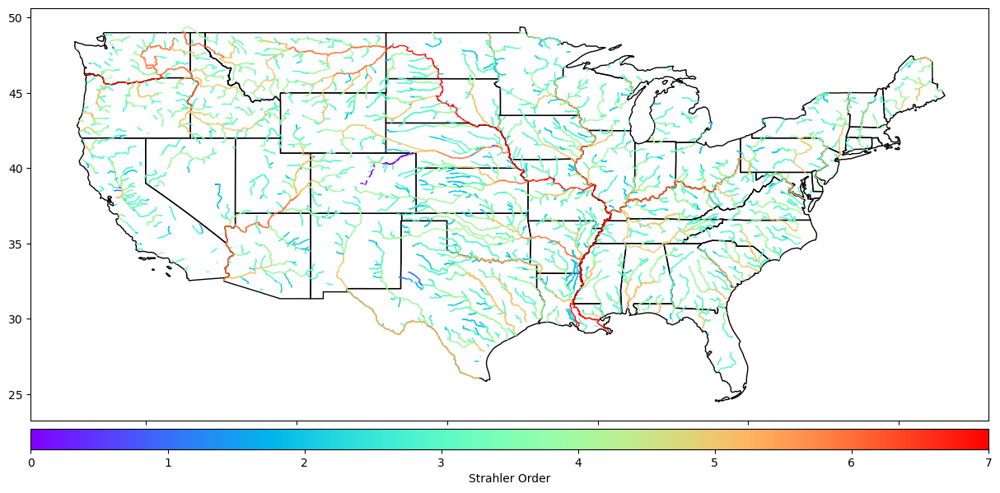

In [7]:
fig, ax = plt.subplots(figsize=(15, 15))
#fig, ax = plt.subplots(1, 1)

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.1)

lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
lower48 = lower48.to_crs(epsg=4269)
#lower48 = lower48.to_crs(epsg=3035)
#lower48 = lower48.to_crs('ESRI:102003')
lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 

stream_network = gpd.read_file('ShapeFiles/Streams_US/stream_network.shp')
stream_network.crs = "epsg:3035"
#stream_network = stream_network.to_crs(crs=4269)
stream_network = stream_network.to_crs(crs=3035)
#stream_network = stream_network.to_crs('ESRI:102003')
stream_network.plot(ax=ax, column='STRAHLER', cmap='rainbow', linewidth=1, cax=cax,
                    alpha=0.98, legend=True, legend_kwds={"orientation": "horizontal", "label": "Strahler Order"}) 

plt.show()

In [216]:
stream_network.head()

,RF1_150_ID,HUC,SEG,MILEPT,SEQNO,RFLAG,OWFLAG,TFLAG,SFLAG,TYPE,...,LOWV,WORKA,GAGECODE,STRAHLER,RR,DSRR,HUC2,HUC4,HUC6,geometry
0,1,1010001,1,0.0,2183,1,0,1,0,T,...,1.13,1,1,5,01010001001,1010001057,1,101,10100,"LINESTRING (-67.79 47.056, -67.792 47.056, -67..."
1,2,1010001,2,0.0,2181,1,0,0,0,R,...,1.13,0,1,5,01010001002,1010001001,1,101,10100,"LINESTRING (-67.925 47.142, -67.927 47.143, -6..."
2,3,1010001,3,0.0,2177,1,0,0,0,R,...,1.09,1,1,5,01010001003,1010001002,1,101,10100,"LINESTRING (-67.939 47.152, -67.941 47.154, -6..."
3,4,1010001,4,0.0,2098,1,0,0,0,R,...,0.96,1,1,4,01010001004,1010001003,1,101,10100,"LINESTRING (-68.612 47.239, -68.614 47.238, -6..."
4,7,1010001,19,0.0,2087,1,0,0,0,R,...,0.83,0,1,4,01010001019,1010001004,1,101,10100,"LINESTRING (-68.895 47.171, -68.898 47.17, -68..."


In [217]:
geo_df.head()

,Unnamed_ 0,site_no,analyze_ra,quantile,valid,missing_da,threshold,hmf_years,annual_hmf,six_mo_hmf,...,LOWV,WORKA,GAGECODE,STRAHLER,RR,DSRR,HUC2,HUC4,HUC6,geometry
0,1,2342500,30,0.9,1,0.0,850.3,30,0.109441,0.095362,...,1.75,0,1,3,03130003022,3130003021,3,313,31300,POINT (-85.01493 32.31681)
1,2,2361000,30,0.9,1,0.0,1770.0,30,0.155185,0.118945,...,0.46,1,1,3,03140201016,3140201010,3,314,31402,POINT (-85.61049 31.34295)
2,4,2363000,30,0.9,1,0.0,1300.0,30,0.114796,0.092049,...,0.35,0,1,3,03140202014,3140202013,3,314,31402,POINT (-85.783 31.59489)
3,6,2369800,30,0.9,1,0.0,261.0,29,0.027931,0.016594,...,0.74,1,1,3,03140103023,3140103011,3,314,31401,POINT (-86.70996 31.02768)
4,7,2371500,30,0.9,1,0.0,1380.0,30,0.117638,0.091072,...,0.47,1,1,2,03140301006,3140301005,3,314,31403,POINT (-86.25162 31.57349)


In [214]:
# # Plot map with dams
# fig, ax = plt.subplots(figsize=(35, 35))

# lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
# #lower48 = lower48.to_crs(epsg=4269)
# #lower48 = lower48.to_crs(epsg=3035)
# lower48 = lower48.to_crs('ESRI:102003')

# dams_df = gpd.read_file('ShapeFiles/Dams_US/US_dams_shp.shp')
# dams_df = dams_df.to_crs('ESRI:102003')
# dams_df_clip = dams_df.clip(lower48)

# lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 
# dams_df_clip.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0)

In [15]:
# Add stream_network columns to geo_df
geo_df = geo_df.sjoin_nearest(stream_network, how='inner')

In [228]:
# Save combined geo_df
# geo_df_no_datetime = geo_df.drop(columns=['analyze_start', 'analyze_end', 'data_start', 'data_end'])
# geo_df_no_datetime.to_file('ShapeFiles/Streams_US/metrics_stream_order_30_90.shp', driver='ESRI Shapefile')

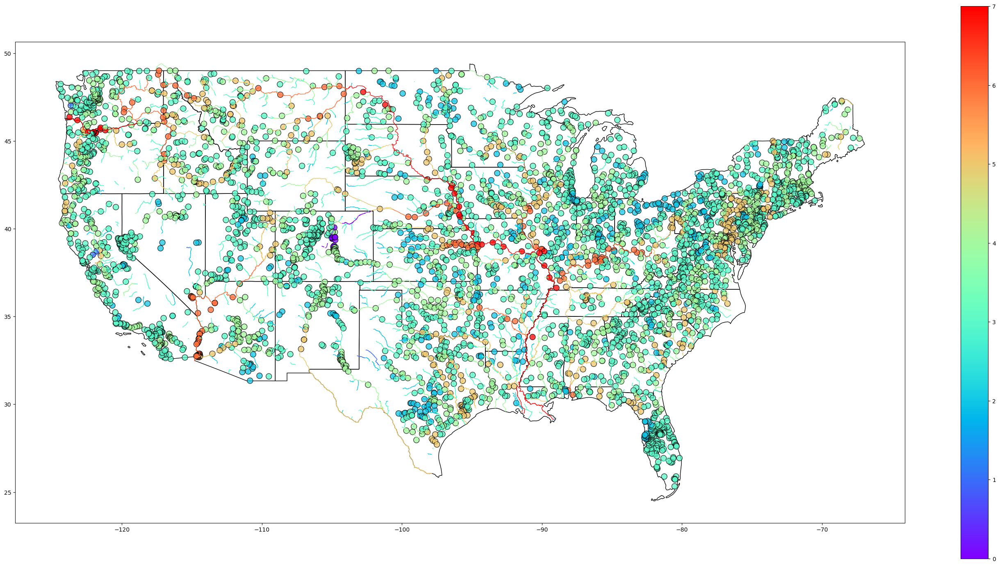

In [10]:
fig, ax = plt.subplots(figsize=(35, 35))

lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
lower48 = lower48.to_crs(epsg=4269)
#lower48 = lower48.to_crs(epsg=3035)
#lower48 = lower48.to_crs('ESRI:102003')
lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 

lower48_crs = lower48.crs

stream_network.crs = "epsg:4269"
stream_network = stream_network.to_crs(epsg=4269)
stream_network.plot(ax=ax, column='STRAHLER', cmap='rainbow', linewidth=1, alpha=0.98, 
                    legend=True, legend_kwds={"shrink":.5}) 

geo_df = gpd.read_file('ShapeFiles/Streams_US/metrics_stream_order_30_90.shp')
# geo_df = geo_df.set_crs(lower48_crs, allow_override=True)  # Set CRS to match lower48
# geo_df = geo_df.to_crs(lower48_crs)  # Transform to lower48 CRS
geo_df.crs = "epsg:3035"
geo_df = geo_df.to_crs(crs=4269)
bx = geo_df.plot(ax=ax, column='STRAHLER', cmap='rainbow', marker='o', markersize=100, 
                         edgecolor='black', linewidth=1, alpha=0.75, legend=False, legend_kwds={"shrink":.5})

In [11]:
# Plot gages
def plot_valid_gages(date, percentile):
    df = dfs_valid[f'{date_range}_{percentile}']
    fig, ax = plt.subplots(figsize=(35, 35))
    
    plt.title(f'Valid Gages ({date}-yr Range, {percentile}th Percentile)', fontsize=30)

    lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
    lower48 = lower48.to_crs(epsg=4269)
    #lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1.0) 
    
    stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2) 

    lat = df['dec_lat_va'].tolist()
    long = df['dec_long_va'].tolist()
    geometry = [Point(xy) for xy in zip(long, lat)]
    geo_pts = gpd.GeoDataFrame(geometry=geometry)

    bx = geo_pts.plot(ax=ax, color='green', marker='o', markersize=100, 
                         edgecolor='black', linewidth=1, alpha=0.75, legend=True) 

    plt.axis("off")

    plt.show()
    return

#for date in date_ranges:
#    for percentile in percentiles:
#        plot_valid_gages(date, percentile)

### Plotly map of all gages

In [16]:
import plotly.express as px

df_1 = geo_df.copy()

# The metric to color the datapoints by
#color_metric = "inter_annual%"
# The metric to size the datapoints by
size_metric = "STRAHLER"
#size_metric = 'annual_hmf'

df_1 = df_1.sort_values(by=size_metric, ascending=True)

fig = px.scatter_mapbox(df_1, lat="dec_lat_va", lon="dec_long_v", hover_name='site_no', 
                        hover_data=["site_no", "station_nm","annual_hmf"], color=size_metric,
                        zoom=3, height=700, width=1200, color_continuous_scale=px.colors.sequential.Bluered, opacity=0.75)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_geos(fitbounds="locations", visible=False)

import plotly.io as pio
pio.renderers.default = 'iframe'

fig.show()

## Gages for individual aquifers

In [115]:
aq_list_10 = ['High Plains aquifer',
                'Mississippi River Valley alluvial aquifer',
                'Central Valley aquifer system',
                'Basin and Range basin-fill aquifers',
                'Floridan aquifer system',
                'Snake River Plain basaltic-rock aquifers',
                'Coastal lowlands aquifer system',
                'California Coastal Basin aquifers', 
                'Pacific Northwest basin-fill aquifers',
                'Northern Atlantic Coastal Plain aquifer system']

aq_list_25 = ['Southeastern Coastal Plain aquifer system',
       'Coastal lowlands aquifer system', 'Floridan aquifer system',
       'Valley and Ridge aquifers',
       'Piedmont and Blue Ridge crystalline-rock aquifers',
       'Mississippi embayment aquifer system',
       'Basin and Range basin-fill aquifers',
       'Mississippi River Valley alluvial aquifer',
       'Pacific Northwest basin-fill aquifers',
       'California Coastal Basin aquifers',
       'Central Valley aquifer system',
       'Pacific Northwest basaltic-rock aquifers',
       'Northern Atlantic Coastal Plain aquifer system',
       'Surficial aquifer system', 'Biscayne aquifer',
       'Northern Rocky Mountains Intermontane Basins aquifer system',
       'Snake River Plain basaltic-rock aquifers',
       'Columbia Plateau basaltic-rock aquifers',
       'Cambrian-Ordovician aquifer system', 'Silurian-Devonian aquifers',
       'Lower Cretaceous aquifers', 'High Plains aquifer',
       'Rio Grande aquifer system', 'Edwards-Trinity aquifer system',
       'Willamette Lowland basin-fill aquifers']

aq_list_selected = ['Columbia Plateau basaltic-rock aquifers',
 'Edwards-Trinity aquifer system',
 'Floridan aquifer system',
 'Mississippi River Valley alluvial aquifer',
 'Mississippi embayment aquifer system',
 'Piedmont and Blue Ridge aquifers',
 'Snake River Plain basaltic-rock aquifers',
 'Central-South High Plains',
 'Northern High Plains',
 'Texas Gulf Coast',
 'Arizona Alluvial',
 'San Joaquin and Tulare River Basin',
 'Sacramento River Basin',
 'Coastal Lowlands',
 'Upper Colorado']

aq_list_rateb = ['Columbia Plateau',
 'Edwards-Trinity aquifer system',
 'Central-South High Plains',
 'Northern High Plains',
 'Texas Gulf Coast',
 'Mississippi Embayment',
 'Arizona Alluvial',
 'Upper Colorado',
 'Floridan',
 'San Joaquin and Tulare River Basin',
 'Sacramento River Basin',
 'Pennsylvania',
 'Coastal Lowlands',
 'Snake River Basin']

## HUC4s intersecting with aquifer

### Top 25 aqs

In [48]:
huc4_intersect_dict = {}
for aq_name in aq_list_25:
    aq = aq_usgs_selected_25[aq_usgs_selected_25['AQ_NAME'] == aq_name]
    intersecting_rows = gpd.sjoin(huc4, aq, how="inner", predicate="intersects")
    intersecting_list = intersecting_rows['huc4_code'].tolist()
    intersecting_list = [int(num) for num in intersecting_list]
    huc4_intersect_dict[aq_name] = intersecting_list

import json
print(json.dumps(huc4_intersect_dict, indent=None, separators=(", ", ": ")))
#huc4_intersect_dict

{"Southeastern Coastal Plain aquifer system": [304, 305, 306, 307, 313, 314, 315, 316, 514, 603, 604, 714, 801, 803], "Coastal lowlands aquifer system": [314, 315, 316, 317, 318, 803, 804, 805, 806, 807, 808, 809, 1114, 1201, 1202, 1203, 1204, 1207, 1209, 1210, 1211, 1308, 1309, 1312], "Floridan aquifer system": [308, 310, 311, 312, 313, 314, 315], "Valley and Ridge aquifers": [202, 204, 205, 207, 208, 301, 315, 316, 501, 505, 507, 513, 601, 602, 603], "Piedmont and Blue Ridge crystalline-rock aquifers": [202, 203, 204, 205, 206, 207, 208, 301, 302, 303, 304, 305, 306, 307, 313, 315, 505, 601, 602], "Mississippi embayment aquifer system": [314, 315, 316, 317, 318, 514, 604, 801, 802, 803, 804, 806, 1111, 1114, 1201], "Basin and Range basin-fill aquifers": [1303, 1501, 1503, 1504, 1505, 1506, 1507, 1508, 1601, 1602, 1603, 1604, 1605, 1606, 1704, 1705, 1712, 1807, 1808, 1809, 1810], "Mississippi River Valley alluvial aquifer": [514, 714, 801, 802, 803, 804, 805, 806, 1101, 1111], "Pacifi

### Rateb aqs

In [135]:
gdf_aq_selected = gdf_aq_selected.to_crs(epsg=4269)
huc4 = huc4.to_crs(epsg=4269)

huc4_intersect_dict = {}
for aq_name in aq_list_rateb:
    aq = gdf_aq_selected[gdf_aq_selected['aq_name'] == aq_name]
    intersecting_rows = gpd.sjoin(huc4, aq, how="inner", predicate="intersects")
    intersecting_list = intersecting_rows['huc4_code'].tolist()
    intersecting_list = [int(num) for num in intersecting_list]
    huc4_intersect_dict[aq_name] = intersecting_list

import json
print(json.dumps(huc4_intersect_dict, indent=None, separators=(", ", ": ")))

{"Columbia Plateau": [1701, 1702, 1703, 1705, 1706, 1707], "Edwards-Trinity aquifer system": [1207, 1208, 1209, 1210, 1211, 1304, 1306, 1307, 1308], "Central-South High Plains": [1026, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1112, 1113, 1205, 1208, 1306, 1307], "Northern High Plains": [1012, 1014, 1015, 1017, 1018, 1019, 1020, 1021, 1022, 1025, 1026, 1027, 1102], "Texas Gulf Coast": [808, 1114, 1201, 1202, 1203, 1204, 1207, 1209, 1210, 1211, 1308, 1309, 1311, 1312], "Mississippi Embayment": [315, 316, 317, 318, 514, 604, 714, 801, 802, 803, 804, 805, 806, 1101, 1111, 1114], "Arizona Alluvial": [1302, 1303, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1606, 1810], "Upper Colorado": [1008, 1018, 1302, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1501, 1502, 1504, 1506, 1601, 1602, 1603, 1704], "Floridan": [302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314], "San Joaquin and Tulare River Basin": [1605, 1802, 1803, 1804, 1805, 1806, 1807, 1809], "Sacrament

In [46]:
aq_name = 'Basin and Range basin-fill aquifers'
aq = aq_usgs_selected_25[aq_usgs_selected_25['AQ_NAME'] == aq_name]
print(aq.crs)
print(huc4.crs)
intersecting_rows = gpd.sjoin(huc4, aq, how="inner", predicate="intersects")
intersecting_list = intersecting_rows['huc4_code'].tolist()
intersecting_list = [int(num) for num in intersecting_list]
huc4_intersect_dict[aq_name] = intersecting_list

EPSG:4269
EPSG:4269


In [176]:
# Outlet gages by aquifer
br_outlet_gages = ['09520500', '09521100', '09519800', '09429100', '10327500', '10351650', '10311400'] # '09468500', '09429600'
cc_outlet_gages = ['11023000', '11046000', '11078000', '11087020', '11133000', '11140000', '11152500', '11159000', '11467000', '11477000', '11530500', '11532500']
cv_outlet_gages = ['11303500', '11447650']
cl_outlet_gages = ['08211000', '08188500', '08176500', '08164000', '08162000', '08116650', '08066500', '08033500', '08068000', '08030500',
      '08013500', '08012000', '07378500', '02492000', '02489500', '02479000', '02479300', '02469761', '02428400', '02375500']
fl_outlet_gages = ['02368000', '02365500', '02358000', '02320500', '02313230']
hp_outlet_gages = ['06465500', '06805500', '06853500', '06884000', '07144550', '07158000', '07237500', '07228000', '07297910', '08123850']
mr_outlet_gages = ['07077000', '07077555', '07047942', '07369000', '07288280', '07285500', '07268000', '07363500']
na_outlet_gages = ['02080500', '02105769', '02089500', '02091500', '02083500', '02052000', '02047000', '02049500',  '02041650', '02037500', '01668000', 
      '01673000',  '01646500', '01578310', '01474500',  '01463500', '01674500'] #'02105769', '02085000'
pn_outlet_gages = ['12200500', '12040500', '14211720',  '14372300']
sr_outlet_gages = ['13269000']
sr_outlet_gages_6 = ['13251000', '13206000', '13183000', '13142500', '13152500', '13168500', '13094000']
cp_outlet_gages = ['13342500', '13334300', '12472800', '12510500', '13351000', '14033500', '14048000', '14103000']
rg_outlet_gages = ['08319000']
me_outlet_gages = ['07029500', '07268000', '07283000', '07285500', '07289350', '02482550', '02477000', '02469761', '02428400', 
                   '07362000', '07363500', '07348700']
co_outlet_gages = ['05378500', '05407000', '05437500', '04082400']
sc_outlet_gages = ['02130561', '02171500', '02197000', '02223248', '02343801', '02467000']
bi_outlet_gages = ['02287497', '02289060', '02290765', '02290769']
et_outlet_gages = ['07337000', '08062700', '08159200', '08168500']
rm_outlet_gages = ['12389000', '06066500', '13302500']
pb_outlet_gages = ['02341475', '02339500', '02347500', '02213000', '02223000', '02197000', '02169500', 
'02148000', '02130561', '02102500', '02089000', '02083500' ,'02080500', '01646500', '01578310']
sa_outlet_gages = ['02359170', '02243960', '02296750', '02292900', '02226000', '02202500', '02198500', '02175000', '02171645']
vr_outlet_gages = ['02388500', '02397000', '03513000', '03455000', '03168000', '02019500', '01638500', '01570500']
sd_outlet_gages = ['05465500', '05420500', '05527500', '03335500']
pnb_outlet_gages = ['13087995', '12395500']
wl_outlet_gages = ['14211720'] 
lc_outlet_gages = ['05476750', '05479000', '05482300', '05483450', '06602020', '06606600', '06607200',
       '06809210', '06486000', '06601200', '06864500', '06865500', '06868200', '06869500',
       '06876700', '06884025', '06884200', '05061500', '05304500', '05313500', '05317000',
       '05476000', '06078200', '06090300', '06200000', '06601000', '06803000', '06803500',
       '06803510', '06803530', '06804000', '06881000', '05085000', '06395000', '06400000',
       '06402500', '06406000', '06414000', '06430500', '06433000', '06436000', '06436190',
       '06429997', '06279500', '06634620']

outlet_gages_dict_10 = {
    'br': br_outlet_gages, 
    'cc': cc_outlet_gages,
    'cv': cv_outlet_gages,
    'cl': cl_outlet_gages,
    'fl': fl_outlet_gages,
    'hp': hp_outlet_gages,
    'mr': mr_outlet_gages,
    'na': na_outlet_gages,
    'pn': pn_outlet_gages,
    'sr': sr_outlet_gages
}

outlet_gages_dict_25 = {
    'br': br_outlet_gages, 
    'cc': cc_outlet_gages,
    'cv': cv_outlet_gages,
    'cl': cl_outlet_gages,
    'fl': fl_outlet_gages,
    'hp': hp_outlet_gages,
    'mr': mr_outlet_gages,
    'na': na_outlet_gages,
    'pn': pn_outlet_gages,
    'sr': sr_outlet_gages,
    'cp': cp_outlet_gages,
    'rg': rg_outlet_gages,
    'me': me_outlet_gages,
    'co': co_outlet_gages,
    'sc': sc_outlet_gages,
    'bi': bi_outlet_gages,
    'et': et_outlet_gages,
    'rm': rm_outlet_gages,
    'pb': pb_outlet_gages,
    'sa': sa_outlet_gages,
    'vr': vr_outlet_gages,
    'sd': sd_outlet_gages,
    'pnb': pnb_outlet_gages,
    'wl': wl_outlet_gages,
    'lc': lc_outlet_gages}

aq_names_10 = {'hp': 'High Plains aquifer',
                'mr': 'Mississippi River Valley alluvial aquifer',
                'cv': 'Central Valley aquifer system',
                'br': 'Basin and Range basin-fill aquifers',
                'fl': 'Floridan aquifer system',
                'sr': 'Snake River Plain basaltic-rock aquifers',
                'cl': 'Coastal lowlands aquifer system',
                'cc': 'California Coastal Basin aquifers', 
                'pn': 'Pacific Northwest basin-fill aquifers',
                'na': 'Northern Atlantic Coastal Plain aquifer system'}

aq_names_25 = {'hp': 'High Plains aquifer',
                'mr': 'Mississippi River Valley alluvial aquifer',
                'cv': 'Central Valley aquifer system',
                'br': 'Basin and Range basin-fill aquifers',
                'fl': 'Floridan aquifer system',
                'sr': 'Snake River Plain basaltic-rock aquifers',
                'cl': 'Coastal lowlands aquifer system',
                'cc': 'California Coastal Basin aquifers', 
                'pn': 'Pacific Northwest basin-fill aquifers',
                'na': 'Northern Atlantic Coastal Plain aquifer system',
                'cp': 'Columbia Plateau basaltic-rock aquifers',
                'rg': 'Rio Grande aquifer system',
                'me': 'Mississippi embayment aquifer system',
                'co': 'Cambrian-Ordovician aquifer system',
                'sc': 'Southeastern Coastal Plain aquifer system',
                'bi': 'Biscayne aquifer',
                'et': 'Edwards-Trinity aquifer system',
                'rm': 'Northern Rocky Mountains Intermontane Basins aquifer system',
                'pb': 'Piedmont and Blue Ridge crystalline-rock aquifers',
                'sa': 'Surficial aquifer system',
                'vr': 'Valley and Ridge aquifers',
                'sd': 'Silurian-Devonian aquifers',
                'pnb': 'Pacific Northwest basaltic-rock aquifers',
                'wl': 'Willamette Lowland basin-fill aquifers',
                'lc': 'Lower Cretaceous aquifers'
              }

aq_names_rateb = {
    'cp': 'Columbia Plateau',
    'et': 'Edwards-Trinity aquifer system',
    'hp_cs': 'Central-South High Plains',
    'hp_n': 'Northern High Plains',
    'txg': 'Texas Gulf Coast',
    'mr_me': 'Mississippi Embayment',
    'az': 'Arizona Alluvial',
    'uc': 'Upper Colorado',
    'fl': 'Floridan',
    'cv_sj': 'San Joaquin and Tulare River Basin',
    'cv_sac': 'Sacramento River Basin',
    'pen': 'Pennsylvania',
    'cl': 'Coastal Lowlands',
    'sr': 'Snake River Basin'
}

aq_codes_10 = ['hp', 'mr', 'cv', 'br', 'fl', 'sr', 'cl', 'cc', 'pn', 'na']

aq_codes_25 = ['hp', 'mr', 'cv', 'br', 'fl', 'sr', 'cl', 'cc', 'pn', 'na',
              'cp', 'rg', 'me', 'co', 'sc', 'bi', 'et', 'rm', 'pb', 'sa',
              'vr', 'sd', 'pnb', 'wl', 'lc']

aq_codes_rateb = ['cp', 'et', 'hp_cs', 'hp_n', 'txg', 'mr_me', 'az', 
                  'uc', 'fl', 'cv_sj', 'cv_sac', 'pen', 'cl', 'sr']

hp_huc4s = [1012, 1014, 1015, 1017, 1018, 1019, 1020, 1021, 1022, 1025, 1026, 1027, 
            1102, 1103, 1104, 1105, 1106, 1108, 1109, 1110, 1112, 1113, 1205, 1208, 
            1306, 1307]
mr_huc4s = [514, 714, 801, 802, 803, 804, 805, 806, 1101, 1111, 1114] # 315, 316, 317, 318, 604, 
cv_huc4s = [1804, 1802, 1803]
br_huc4s = [1303, 1501, 1503, 1504, 1505, 1506, 1507, 1508, 1601, 1602, 1603, 1604, 1605, 1606, 
            1704, 1705, 1712, 1807, 1808, 1809, 1810]
fl_huc4s = [308, 310, 311, 312, 313, 314] #[309, 310, 308, 311, 312, 314, 315, 313, 307, 306, 305, 304, 303]
sr_huc4s = [1704, 1705]
cl_huc4s = [314, 315, 316, 317, 318, 803, 804, 805, 806, 807, 808, 809, 
            1114, 1201, 1202, 1203, 1204, 1207, 1209, 1210, 1211, 1308, 1309, 1312]
# [314, 315, 316, 317, 318, 804, 805, 806, 807, 808, 809, 1114, 1201, 1202, 1203, 1204, 1207, 1209, 1210, 1211]
cc_huc4s = [1801, 1802, 1803, 1804, 1805, 1806, 1807, 1810] #[1807, 1806, 1805, 1801]
pn_huc4s = [1601, 1602, 1604, 1605, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1708, 1709, 1710, 1711, 1712, 1801, 1802, 1808] 
# [1002, 1007, 1601, 1604, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1708, 1709, 1710, 1711, 1712, 1801, 1802, 1808]
na_huc4s = [203, 204, 205, 206, 207, 208, 301, 302, 303, 304] 
cp_huc4s = [1701, 1702, 1703, 1705, 1706, 1707]
rg_huc4s = [1301, 1302, 1303, 1304, 1305, 1306, 1307, 1504] # 1508
me_huc4s = [314, 315, 316, 317, 318, 514, 604, 801, 802, 803, 804, 806, 1111, 1114, 1201]
co_huc4s = [401, 402, 403, 418, 419, 420, 701, 702, 703, 704, 705, 706, 707, 708, 709, 711, 712, 713]
et_huc4s = [804, 1113, 1114, 1203, 1206, 1207, 1208, 1209, 1210, 1211, 1304, 1307, 1308]
sa_huc4s = [302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317]
sc_huc4s = [304, 305, 306, 307, 313, 314, 315, 316, 514, 603, 604, 714, 801, 803]
bi_huc4s = [309]
rm_huc4s = [1002, 1003, 1007, 1701, 1704, 1705, 1706]
pb_huc4s = [202, 203, 204, 205, 206, 207, 208, 301, 302, 303, 304, 305, 306, 307, 313, 315, 505, 601, 602]
vr_huc4s = [202, 204, 205, 207, 208, 301, 315, 316, 501, 505, 507, 513, 601, 602, 603]
sd_huc4s = [402, 403, 404, 405, 406, 407, 409, 410, 419, 420, 424, 426, 
            506, 508, 509, 510, 511, 512, 513, 514, 604, 702, 706, 708, 709, 710, 711, 712, 713, 714]
pnb_huc4s = [1002, 1007, 1601, 1604, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1708, 1709, 1710, 1711, 1712, 1801, 1802, 1808]
wl_huc4s = [1708, 1709] # 1710
lc_huc4s = [401, 701, 702, 708, 710, 902, 1003, 1004, 1007, 1008, 1009, 1011, 1012, 
            1017, 1018, 1020, 1022, 1023, 1024, 1025, 1026, 1027, 1103, 1104, 1106, 1107, 1404, 1701]
uc_huc4s = [1008, 1018, 1302, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1501, 1502, 1504, 1506, 1601, 1602, 1603, 1704]

huc_dict_25 = {
    'hp': hp_huc4s, 
    'mr': mr_huc4s,
    'cv': cv_huc4s,
    'br': br_huc4s,
    'fl': fl_huc4s,
    'sr': sr_huc4s,
    'cl': cl_huc4s,
    'cc': cc_huc4s,
    'pn': pn_huc4s,
    'na': na_huc4s,
    'cp': cp_huc4s,
    'rg': rg_huc4s,
    'me': mr_huc4s,
    'co': co_huc4s,
    'et': et_huc4s,
    'sa': sa_huc4s,
    'sc': sc_huc4s,
    'bi': bi_huc4s,
    'rm': rm_huc4s,
    'pb': pb_huc4s,
    'vr': vr_huc4s,
    'sd': sd_huc4s,
    'pnb': pnb_huc4s,
    'wl': wl_huc4s,
    'lc': lc_huc4s,
    'uc': uc_huc4s
}

cp_huc4s_r = [1701, 1702, 1703, 1705, 1706, 1707]
et_huc4s_r = [1207, 1208, 1209, 1210, 1211, 1304, 1306, 1307, 1308]
hp_cs_huc4s_r = [1026, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1112, 1113, 1205, 1208, 1306, 1307]
hp_n_huc4s_r = [1012, 1014, 1015, 1017, 1018, 1019, 1020, 1021, 1022, 1025, 1026, 1027, 1102]
txg_huc4s_r = [808, 1114, 1201, 1202, 1203, 1204, 1207, 1209, 1210, 1211, 1308, 1309, 1311, 1312]
mr_me_huc4s_r = [315, 316, 317, 318, 514, 604, 714, 801, 802, 803, 804, 805, 806, 1101, 1111, 1114]
az_huc4s_r = [1302, 1303, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1606, 1810]
uc_huc4s_r = [1008, 1018, 1302, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1501, 1502, 1504, 1506, 1601, 1602, 1603, 1704]
fl_huc4s_r = [302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314]
cv_sj_huc4s_r = [1605, 1802, 1803, 1804, 1805, 1806, 1807, 1809]
cv_sac_huc4s_r = [1605, 1712, 1801, 1802, 1804, 1805, 1808]
pen_huc4s_r = [205, 315, 316, 411, 501, 502, 503, 504, 505, 506, 507, 509, 510, 513, 601, 602, 603]
cl_huc4s_r = [314, 315, 316, 317, 318, 803, 804, 805, 806, 807, 808, 809, 1114, 1201, 1204]
sr_huc4s_r = [1002, 1601, 1602, 1701, 1704, 1705, 1706]

huc_dict_rateb = {
    'cp': cp_huc4s_r,
    'et': et_huc4s_r,
    'hp_cs': hp_cs_huc4s_r,
    'hp_n': hp_n_huc4s_r,
    'txg': txg_huc4s_r,
    'mr_me': mr_me_huc4s_r,
    'az': az_huc4s_r,
    'uc': uc_huc4s_r,
    'fl': fl_huc4s_r,
    'cv_sj': cv_sj_huc4s_r,
    'cv_sac': cv_sac_huc4s_r,
    'pen': pen_huc4s_r,
    'cl': cl_huc4s_r,
    'sr': sr_huc4s_r
}

In [202]:
for key, value in huc_dict_rateb.items():
    print(key, len(value))

cp 6
et 9
hp_cs 16
hp_n 13
txg 14
mr_me 16
az 12
uc 19
fl 13
cv_sj 8
cv_sac 7
pen 17
cl 15
sr 7


In [19]:
#dfs_valid['30_90'][dfs_valid['30_90']['within_aq'] == 'Central Valley aquifer system']
#dfs_valid['30_90'][dfs_valid['30_90']['huc4_code'].isin(huc_dict_25['hp'])]

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


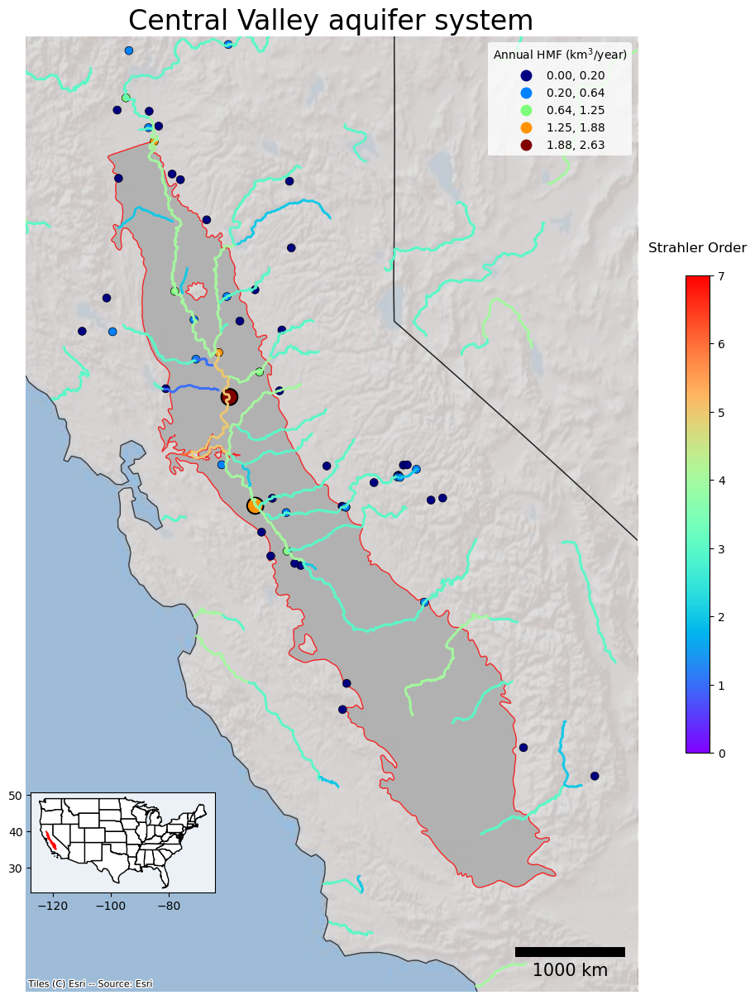

In [54]:
overwrite = True

def plot_single_aquifer(aquifer_name, lower48, df, aq_code):
    fig, ax = plt.subplots(figsize=(15, 15))
    #plt.title(f"Multi-Aquifer {metric} Plot for {range} Years & {quantile}th Quantile", loc='center', fontsize=24)
    plt.title(f'{aquifer_name}', fontsize=24)

    # USA Plot
    lower48 = lower48.to_crs(epsg=4269)
    #lower48 = lower48.to_crs('ESRI:102003')
    lower48.plot(ax=ax, edgecolor='black', facecolor='lightgrey', linewidth=1.0, alpha=0.7) 

    # Stream network plot
    #stream_network = stream_network.to_crs(epsg=4269)
    #stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2)
    stream = stream_network.plot(ax=ax, column='STRAHLER', cmap='rainbow', linewidth=2.0, 
                    alpha=0.98, legend=True, legend_kwds={"shrink":.5}) 
    cbar = stream.get_figure().get_axes()[-1]  # Get the colorbar axis
    cbar.set_title("Strahler Order", pad=20)  # Add a title with padding

    # Aquifer plot
    aq_usgs_selected_25 = gpd.read_file('ShapeFiles/Aquifers_USGS_25/Aquifers_USGS_25.shp')
    aq_usgs_selected_25 = aq_usgs_selected_25.to_crs(epsg=4269)
    aq_shape_1 = aq_usgs_selected_25[aq_usgs_selected_25['AQ_NAME'] == aquifer_name]
    aq_shape_1.plot(ax=ax, facecolor='darkgrey', edgecolor='red', linewidth=1.0, alpha=0.8)

    gdf_aq_selected = gpd.read_file('ShapeFiles/Aquifers_select/selected_aquifers.shp')
    gdf_aq_selected = gdf_aq_selected.to_crs(epsg=4269)
    aq_shape_1 = gdf_aq_selected[gdf_aq_selected['AQ_NAME'] == aquifer_name]
    aq_shape_1.plot(ax=ax, facecolor='darkgrey', edgecolor='red', linewidth=1.0, alpha=0.8)

    # Convert geometry of all gages
    lat = df['dec_lat_va'].tolist()
    long = df['dec_long_va'].tolist()
    geometry = [Point(xy) for xy in zip(long, lat)]
    geo_pts = gpd.GeoDataFrame(geometry=geometry)
    df = df.reset_index()
    geo_df = geo_pts.merge(df, how='left', left_index=True, right_index=True)

    # Select aquifer/huc and outlet gages
    #geo_df = geo_df[geo_df['within_aq'] == aquifer_name]
    geo_df = geo_df[geo_df['huc4_code'].isin(huc_dict_25[aq_code])] # CHANGE ME WITH AQ
    #geo_df = geo_df[geo_df['huc2_code'].isin(huc_dict_25[aq_code])] # CHANGE ME WITH AQ
    geo_df_outlet = geo_df[geo_df['site_no'].isin(outlet_gages_dict_25[aq_code])]

    # Place gages into bins
    metric = 'annual_hmf'
    classifier = mc.NaturalBreaks(geo_df[metric], k=5)
    geo_df = geo_df.sort_values(metric, ascending=True)

    legend_frmt = {
    "title": f"{fn.FLOW_METRIC_UNITS[metric]}",
    "reverse": False,
    "loc": "upper right",
    "facecolor": "white",
    "alignment": 'center',
    "edgecolor": 'none',
    "framealpha": 0.80
    }

    # Set geometry for aq/huc gages
    cmap='jet' #'rainbow_r'
    geo_df = geo_df.set_geometry("geometry_x")
    geo_df.crs = "epsg:4269"
    geo_df = geo_df.to_crs(epsg=4269)
    geo_df.plot(ax=ax, column=metric, scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                cmap=cmap, legend=True, legend_kwds=legend_frmt, 
                alpha=1.0, marker='o', 
                markersize=50,
                edgecolor='black', linewidth=0.5)

    # Set geometry for outlet gages
    cmap='jet' #'rainbow_r'
    geo_df_outlet = geo_df_outlet.set_geometry("geometry_x")
    geo_df_outlet.crs = "epsg:4269"
    geo_df_outlet = geo_df_outlet.to_crs(epsg=4269)    
    #print(geo_df_outlet)
    geo_df_outlet.plot(ax=ax, column=metric, scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                cmap=cmap, legend=False, #legend_kwds=legend_frmt, 
                alpha=1.0, marker='o', 
                markersize=200,
                edgecolor='black', linewidth=1.5)

    # Inset map
    inset = inset_axes(ax, width='30%', height='30%', loc='lower left')
    inset.set_aspect('equal')#, anchor="NW")
    inset.patch.set_alpha(0.80)
    lower48.plot(ax=inset, facecolor='white', edgecolor='black')
    aq_shape_1.plot(ax=inset, facecolor='red', edgecolor='none', linewidth=1.0, alpha=1.0)

    # Add a scale bar (units in meters, adjust as necessary)
    scalebar = ScaleBar(1, location='lower right', font_properties={"size": '15'}, 
                       units="km", dimension="si-length", length_fraction=0.25,
                        scale_formatter=lambda value, unit: f' {value * 1000} km ', pad = 1, box_color='none')  # 1 unit = 1 meter
    ax.add_artist(scalebar)

    # Add padding around aquifer
    xmin, ymin, xmax, ymax = aq_shape_1.total_bounds
    padding = 0.75
    xmin -= padding
    ymin -= padding
    xmax += padding
    ymax += padding

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_yticks([])
    ax.set_xticks([])

    # Add basemap
    ax.margins(0, tight=True)
    ax.set_axis_off()
    crs=4269
    source = cx.providers.Esri.WorldShadedRelief
    zoom = 7
    cx.add_basemap(ax, crs=crs, source=source, zoom=zoom)
    #fn.plot_basemap(ax, source=cx.providers.Esri.WorldShadedRelief)
    
    img_path = f'Saved_Visuals/Aquifers/outlet_gages/{aquifer_name}_30_90_gages.png'
    fn.save_plot_as_image(img_path, overwrite) 

    plt.show()
    
# for aquifer_name in aq_list_25:
#     plot_single_aquifer(aquifer_name, lower48, dfs_valid['30_90'])

# aquifer_name = 'Northern Atlantic Coastal Plain aquifer system'
# aq_code = 'na'

aquifer_name =  'Upper Colorado'
aq_code = 'uc'

plot_single_aquifer(aquifer_name, lower48, dfs_valid['30_90'], aq_code)

In [13]:
# Outlet gages by aquifer
br_outlet_gages = ['09520500', '09429600', '09521100', '09519800', '09468500', '09423000', '10327500', '10351650', '10351650', '10311400']
cc_outlet_gages = ['11023000', '11046000', '11078000', '11087020', '11133000', '11140000', '11152500', '11159000', '11467000', '11477000', '11530500', '11532500']
cv_outlet_gages = ['11303500', '11447650']
cl_outlet_gages = ['08211000', '08188500', '08176500', '08164000', '08162000', '08116650', '08066500', '08033500', '08068000', '08030500',
      '08013500', '08012000', '07378500', '02492000', '02489500', '02479000', '02479300', '02469761', '02428400', '02375500']
fl_outlet_gages = ['0236ds8000', '02365500', '02358000', '02320500', '02313230']
hp_outlet_gages = ['06465500', '06805500', '06853500', '06884000', '07144550', '07158000', '07237500', '07228000', '07297910', '08123850']
mr_outlet_gages = ['07077000', '07077555', '07047942', '07369000', '07369000', '07285500', '07268000']
na_outlet_gages = ['02105769', '02089500', '02091500', '02083500',  '02085000', '02052000', '02047000', '02049500',  '02041650', '02037500', '01668000', 
      '01673000',  '01646500', '01578310', '01474500',  '01463500']
pn_outlet_gages = ['11039800', '12200500', '12040500', '14211720',  '14372300']
sr_outlet_gages = ['13269000']
cp_outlet_gages = ['13342500', '13334300', '12472800', '12510500', '13351000', '14033500', '14048000', '14103000']
rg_outlet_gages = ['08319000']
me_outlet_gages = ['07029500', '07268000', '07283000', '07285500', '07289350', '02482550', '02477000', '02469761', '02428400', 
                   '07362000', '07363500', '07348700']
co_outlet_gages = ['05378500', '05407000', '05437500', '04082400']
sc_outlet_gages = ['02130561', '02171500', '02197000', '02223248', '02343801', '02467000']
bi_outlet_gages = ['02287497', '02289060', '02290765', '02290769']
et_outlet_gages = ['07337000', '08062700', '08159200', '08168500']
rm_outlet_gages = ['12389000', '06066500', '13302500']
pb_outlet_gages = ['02341475', '02339500', '02347500', '02213000', '02223000', '02197000', '02169500', 
'02148000', '02130561', '02102500', '02089000', '02083500' ,'02080500', '01646500', '01578310']
sa_outlet_gages = ['02359170', '02243960', '02296750', '02292900', '02226000', '02202500', '02198500', '02175000', '02171645']
vr_outlet_gages = ['02388500', '02397000', '03513000', '03455000', '03168000', '02019500', '01638500', '01570500']
sd_outlet_gages = ['05465500', '05420500', '05527500', '03335500']
pnb_outlet_gages = ['13087995', '12395500']
wl_outlet_gages = ['14211720']
lc_outlet_gages = ['05476750', '05479000', '05482300', '05483450', '06602020', '06606600', '06607200',
       '06809210', '06486000', '06601200', '06864500', '06865500', '06868200', '06869500',
       '06876700', '06884025', '06884200', '05061500', '05304500', '05313500', '05317000',
       '05476000', '06078200', '06090300', '06200000', '06601000', '06803000', '06803500',
       '06803510', '06803530', '06804000', '06881000', '05085000', '06395000', '06400000',
       '06402500', '06406000', '06414000', '06430500', '06433000', '06436000', '06436190',
       '06429997', '06279500', '06634620']

# # Outlet gages by aquifer
# hp_outlet_gages = ['06447000', '06465500', '06674500', '06764880', '06801000', '06793000', '06800500', '06853500', '06873000', '06881000', 
#                    '07134180', '07144300', '07157500', '07227500', '07235000', '07297910']
# mr_outlet_gages = ['07022000', '07077000', '07288280', '07364200', '07369000', '07074500']
# cv_outlet_gages = ['11447650', '11200800', '11303500']
# br_outlet_gages = ['09415000', '09521100', '09466500', '09469500', '09502000', '09519800', '09537200', '10126000', '10141000', '10219000', 
#                    '10327500', '10351700', '10249280', '13105000', '11062000', '10260500', '10254730']
# fl_outlet_gages = ['02240000', '02313000', '02320500', '02326900', '02358000', '02365500']
# sr_outlet_gages = ['13087995', '13269000']
# cl_outlet_gages = ['02375500', '02471001', '02479000', '02489500', '07373000', '07290000', '07378500', '08013500', '07375000', '08030500', 
#                    '08033500', '08066500', '08068000', '08116650', '08162000', '08176500', '08211000']
# cc_outlet_gages = ['11477000', '11451000', '11458000', '11152500', '11078000']
# pn_outlet_gages = ['10039500', '10172952', '10346000', '12398600', '12447200', '13087995', '13269000', '13317000', '14038530', '14233500', 
#                    '14187200', '14321000', '12045500', '10396000', '11509500', '11377100']
# na_outlet_gages = ['01402000', '01463500', '01578310', '01594440', '01646500', '02037500', '02080500', '02083500', '02105500', '02129000']
# cp_outlet_gages = ['12422500', '12472800', '12510500', '13334300', '14105700']
# rg_outlet_gages = ['08317400', '08361000']
# me_outlet_gages = ['02428400', '02469761', '02477000', '02482550', '03611260', '03610200', '07029500', '07047942', '07268000', '07362000', 
#                    '07289350', '07337000']
# co_outlet_gages = ['04024000', '04045500', '04082400', '05331000', '05330000', '05340500', '05378500', '05369500', '05388250', '05404000', 
#                    '05437500', '05514500', '05552500', '05555300']
# sc_outlet_gages = ['02130561', '02169500', '02197000', '02223500', '02343801', '02373000', '02425000', '02467000', '03399800', '03610200']
# bi_outlet_gages = ['02289060']
# et_outlet_gages = ['07316000', '07335300', '08044500', '08091000', '08102500', '08123850', '08158000', '08167800', '08190000', '08446500']
# rm_outlet_gages = ['06036650', '06054500', '06192500', '12395500', '13142500', '13247500', '13302500']
# pb_outlet_gages = ['01388500', '01463500', '01578310', '01594000', '01646500', '02037500', '02066000', '02082585', '02102500', '02129000', 
#                    '02169500', '02192000', '02213000', '02341460', '02414715', '03168000', '03453500', '03550000']
# sa_outlet_gages = ['02105500', '02131000', '02171500', '02198500', '02226000', '02244040', '02292900', '02296750', '02315500', '02330000', 
#                    '02359170', '02366500']
# vr_outlet_gages = ['01446500', '01570500', '01613000', '02019500', '02056000', '02397000', '02455000', '03176500', '03540500', '03568933']
# sd_outlet_gages = ['04056500', '04087000', '04126740', '04127997', '04166500', '04193500', '04127917', '03227500', '03270500', '03237500', 
#                    '03283500', '03335500', '03434500', '03294500', '03604000', '05412500', '05420500', '05446500', '05587450', '05527500', 
#                    '05570910']
# pnb_outlet_gages = ['06037500', '06188000', '10352500', '12414500', '12488500', '13062500', '13269000', '13341050', '14046500', '14246900', 
#                     '14211720', '14301000', '12205000', '10396000', '11509500', '11377100']
# wl_outlet_gages = ['14142500', '14211720']
# lc_outlet_gages = ['05270700', '05311000', '05449500', '05476750', '05082500', '06090300', '06208500', '06287000', '06436000', '06479010', 
#                    '06630000', '06801000', '06800500', '06486000', '06809500', '06856600', '06876900', '06884025', '07140850']

# HUC4-based outlet gages

## USGS

In [55]:
# NEW huc4 outlet gages by aquifer
hp_outlet_gages = ['06447000', '06465500', '06674500', '06764880', '06801000', '06793000', '06800500', '06853500', '06873000', '06881000', 
                   '07134180', '07144300', '07157500', '07227500', '07235000', '07297910']
mr_outlet_gages = ['07022000', '07077000', '07288280', '07364200', '07369000', '07074500']
cv_outlet_gages = ['11447650', '11200800', '11303500']
br_outlet_gages = ['09415000', '09521100', '09466500', '09469500', '09502000', '09519800', '09537200', '10126000', '10141000', '10219000', 
                   '10327500', '10351700', '10249280', '13105000', '11062000', '10260500', '10254730']
fl_outlet_gages = ['02240000', '02313000', '02320500', '02326900', '02358000', '02365500']
sr_outlet_gages = ['13087995', '13269000']
cl_outlet_gages = ['02375500', '02471001', '02479000', '02489500', '07373000', '07290000', '07378500', '08013500', '07375000', '08030500', 
                   '08033500', '08066500', '08068000', '08116650', '08162000', '08176500', '08211000']
cc_outlet_gages = ['11477000', '11451000', '11458000', '11152500', '11078000']
pn_outlet_gages = ['10039500', '10172952', '10346000', '12398600', '12447200', '13087995', '13269000', '13317000', '14038530', '14233500', 
                   '14187200', '14321000', '12045500', '10396000', '11509500', '11377100']
na_outlet_gages = ['01402000', '01463500', '01578310', '01594440', '01646500', '02037500', '02080500', '02083500', '02105500', '02129000']
cp_outlet_gages = ['12422500', '12472800', '12510500', '13334300', '14105700']
rg_outlet_gages = ['08317400', '08361000']
me_outlet_gages = ['02428400', '02469761', '02477000', '02482550', '03611260', '03610200', '07029500', '07047942', '07268000', '07362000', 
                   '07289350', '07337000']
co_outlet_gages = ['04024000', '04045500', '04082400', '05331000', '05330000', '05340500', '05378500', '05369500', '05388250', '05404000', 
                   '05437500', '05514500', '05552500', '05555300']
sc_outlet_gages = ['02130561', '02169500', '02197000', '02223500', '02343801', '02373000', '02425000', '02467000', '03399800', '03610200']
bi_outlet_gages = ['02289060']
et_outlet_gages = ['07316000', '07335300', '08044500', '08091000', '08102500', '08123850', '08158000', '08167800', '08190000', '08446500']
rm_outlet_gages = ['06036650', '06054500', '06192500', '12395500', '13142500', '13247500', '13302500']
pb_outlet_gages = ['01388500', '01463500', '01578310', '01594000', '01646500', '02037500', '02066000', '02082585', '02102500', '02129000', 
                   '02169500', '02192000', '02213000', '02341460', '02414715', '03168000', '03453500', '03550000']
sa_outlet_gages = ['02105500', '02131000', '02171500', '02198500', '02226000', '02244040', '02292900', '02296750', '02315500', '02330000', 
                   '02359170', '02366500']
vr_outlet_gages = ['01446500', '01570500', '01613000', '02019500', '02056000', '02397000', '02455000', '03176500', '03540500', '03568933']
sd_outlet_gages = ['04056500', '04087000', '04126740', '04127997', '04166500', '04193500', '04127917', '03227500', '03270500', '03237500', 
                   '03283500', '03335500', '03434500', '03294500', '03604000', '05412500', '05420500', '05446500', '05587450', '05527500', 
                   '05570910']
pnb_outlet_gages = ['06037500', '06188000', '10352500', '12414500', '12488500', '13062500', '13269000', '13341050', '14046500', '14246900', 
                    '14211720', '14301000', '12205000', '10396000', '11509500', '11377100']
wl_outlet_gages = ['14142500', '14211720']
lc_outlet_gages = ['05270700', '05311000', '05449500', '05476750', '05082500', '06090300', '06208500', '06287000', '06436000', '06479010', 
                   '06630000', '06801000', '06800500', '06486000', '06809500', '06856600', '06876900', '06884025', '07140850']
uc_outlet_gages = ['08284100', '09163500', '09152500', '09180500', '09217000', '09260050', '09315000', '09380000', '09355500', '09408150', 
                   '09402000', '09504420', '10020100', '10155000', '10217000', '13018300']

## Rateb

# Identifying the largest HMF gages in each HUC4 region

In [180]:
huc_dict = huc_dict_rateb
print(huc_dict['az'])
huc4_shape_1 = huc4[huc4['huc4_code'].isin(huc_dict[aq_code])]
#print(huc4_shape_1)

[1302, 1303, 1501, 1502, 1503, 1504, 1505, 1506, 1507, 1508, 1606, 1810]


In [201]:
gages_list = ['01543500', '02401000', '02465000', '04206000', '03049500', '03075070', '03086000', '03140500', '03198000', '03214500', '03216600', '03282000', '03404000', '03540500', '03568933', '03574500']
dfs_valid['30_90'][dfs_valid['30_90']['site_no'].isin(gages_list)]

,Unnamed: 0,site_no,analyze_start,analyze_end,analyze_range,quantile,valid,missing_data%,threshold,hmf_years,...,data_start,data_end,total_record,state,huc2_code,huc4_code,within_aq,HCDN_2009,station_nm,geometry
14,28,02401000,1990-10-01,2020-09-30,30,0.9,True,0.000,599.0,30,...,1943-10-01,2020-09-30,77.0,AL,3,315,Valley and Ridge aquifers,False,BIG WILLS CREEK NEAR REECE CITY,POINT (-86.0380286 34.0981515)
54,101,02465000,1990-10-01,2020-09-30,30,0.9,True,0.529,19300.0,30,...,1900-10-01,2020-09-30,120.0,AL,3,316,Southeastern Coastal Plain aquifer system,False,BLACK WARRIOR RIVER AT NORTHPORT AL,POINT (-87.5900074 33.20928528)
65,121,03574500,1990-10-01,2020-09-30,30,0.9,True,0.000,1500.0,30,...,1936-01-01,2020-09-30,84.7,AL,6,603,NaN,False,PAINT ROCK RIVER NEAR WOODVILLE AL,POINT (-86.3063737 34.6242547)
973,1982,03568933,1990-10-01,2020-09-30,30,0.9,True,0.000,540.0,30,...,1979-08-30,2020-09-30,41.1,GA,6,602,Valley and Ridge aquifers,False,"LOOKOUT CREEK NEAR NEW ENGLAND, GA",POINT (-85.4635278 34.8968611)
1579,2893,03216600,1990-10-01,2020-09-30,30,0.9,True,0.037,197000.0,24,...,1968-10-01,2020-09-30,52.0,KY,5,509,NaN,False,"OHIO RIVER AT GREENUP DAM NEAR GREENUP, KY",POINT (-82.860447 38.6467448)
1588,2927,03282000,1990-10-01,2020-09-30,30,0.9,True,0.000,10400.0,30,...,1925-10-01,2020-09-30,95.0,KY,5,510,NaN,False,"KENTUCKY RIVER AT LOCK 14 AT HEIDELBERG, KY",POINT (-83.7693625 37.5531418)
1620,3015,03404000,1990-10-01,2020-09-30,30,0.9,True,0.000,6743.0,30,...,1950-10-01,2020-09-30,70.0,KY,5,513,NaN,False,"CUMBERLAND RIVER AT WILLIAMSBURG, KY",POINT (-84.1560449 36.743417)
2892,5488,03140500,1990-10-01,2020-09-30,30,0.9,True,0.164,14300.0,29,...,1936-08-01,2020-09-30,84.2,OH,5,504,NaN,False,Muskingum River near Coshocton OH,POINT (-81.872909 40.24840465)
2953,5625,04206000,1990-10-01,2020-09-30,30,0.9,True,0.000,1200.0,30,...,1921-10-01,2020-09-30,99.0,OH,4,411,NaN,False,Cuyahoga River at Old Portage OH,POINT (-81.5470622 41.1356112)
3255,6092,01543500,1990-10-01,2020-09-30,30,0.9,True,0.000,2790.0,30,...,1938-10-01,2020-09-30,82.0,PA,2,205,NaN,False,"Sinnemahoning Creek at Sinnemahoning, PA",POINT (-78.1030596 41.31728467)


C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


cp
['12422500', '12472800', '12510500', '13334300', '14105700']
5


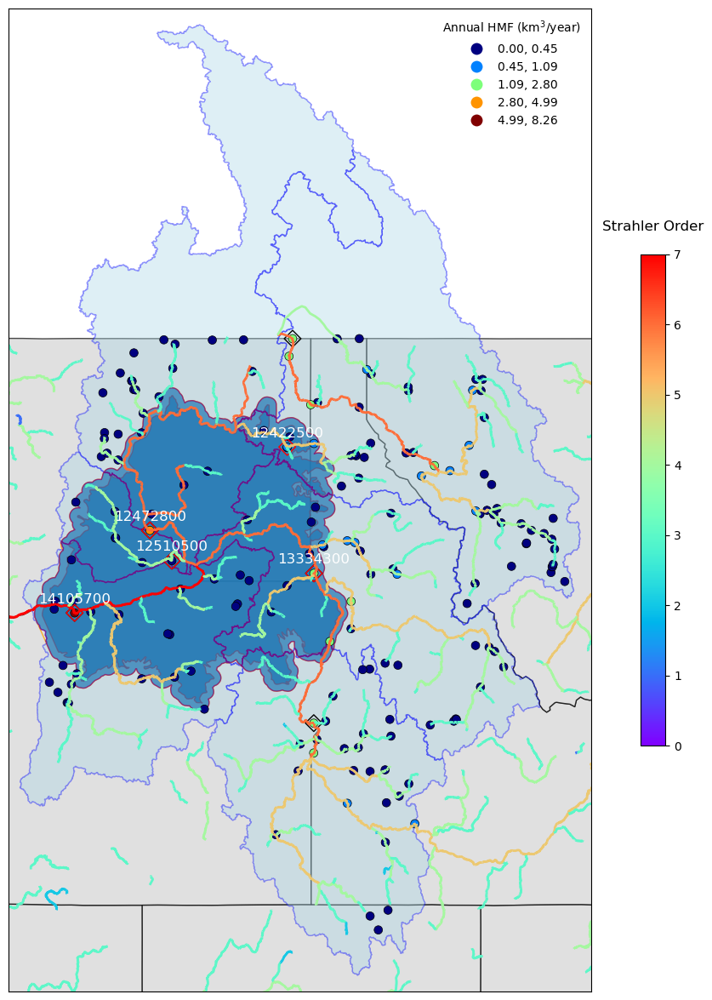

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


et
['08102500', '08123850', '08158000', '08167800', '08190000', '08407500', '08412500']
7


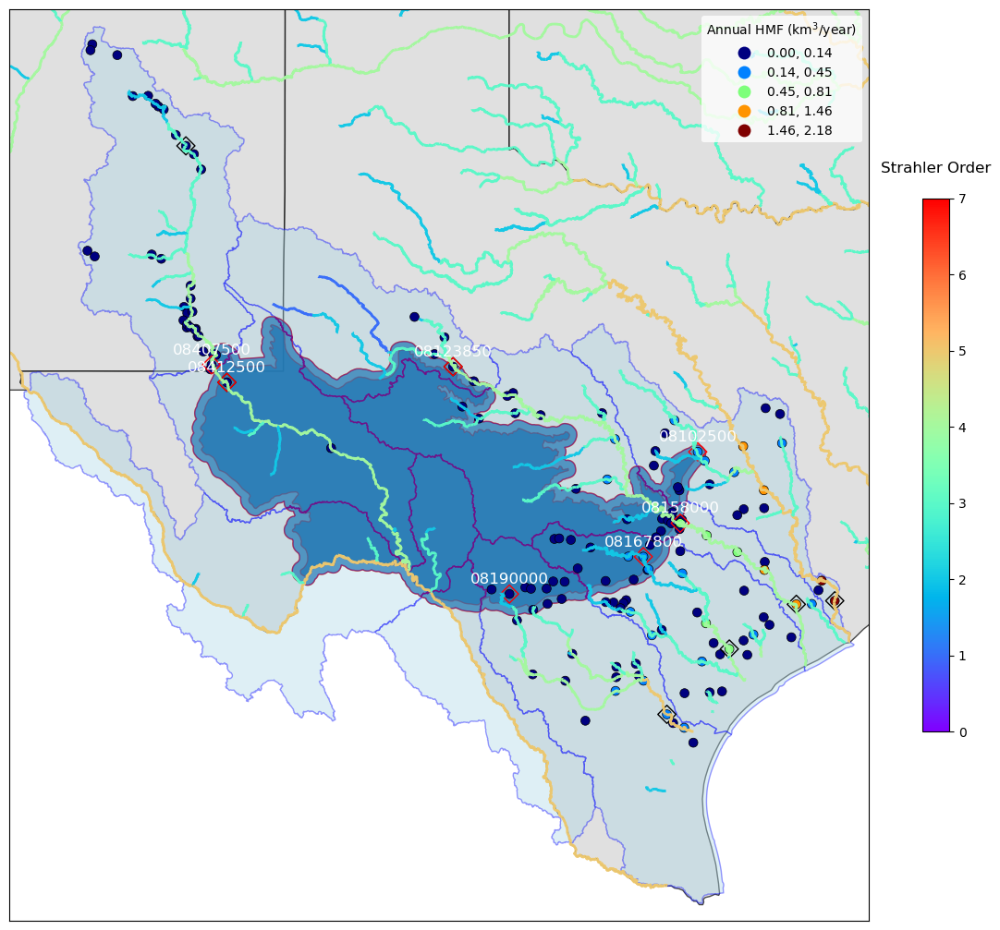

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


hp_cs
['06861000', '07143375', '07157500', '07227500', '07237500', '07297910', '07316500']
7


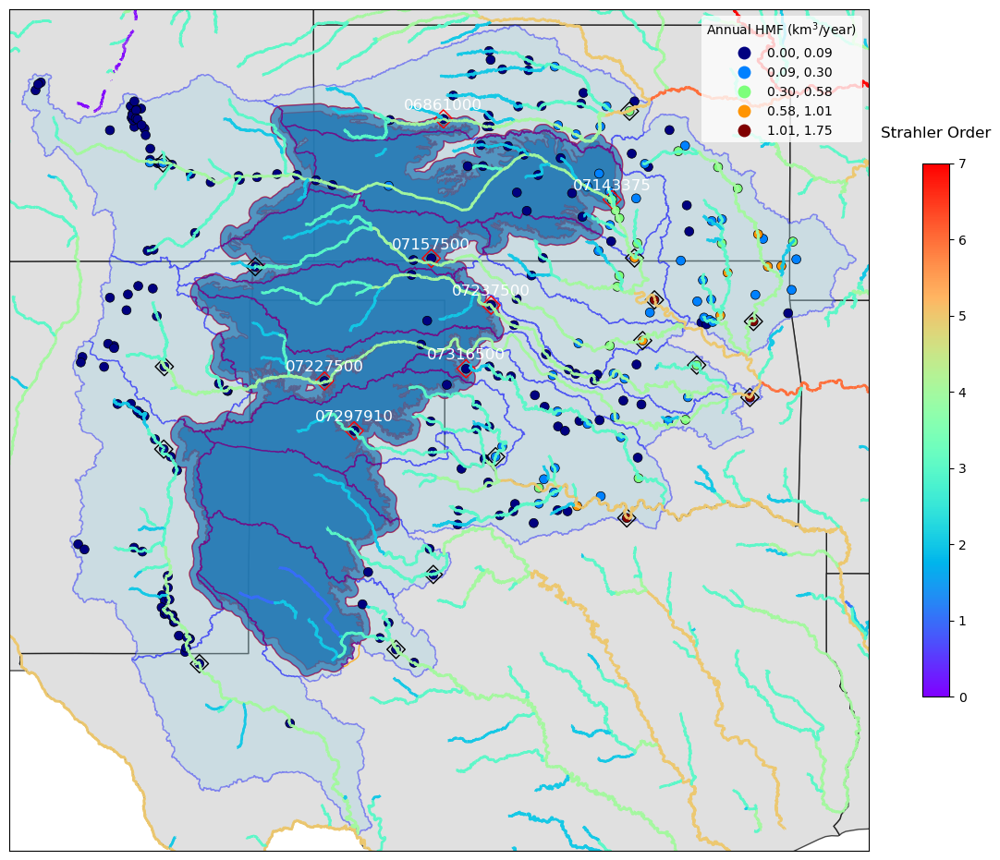

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


hp_n
['06446000', '06464500', '06674500', '06764880', '06796000', '06793000', '06800500', '06853500', '06873000', '06884000']
10


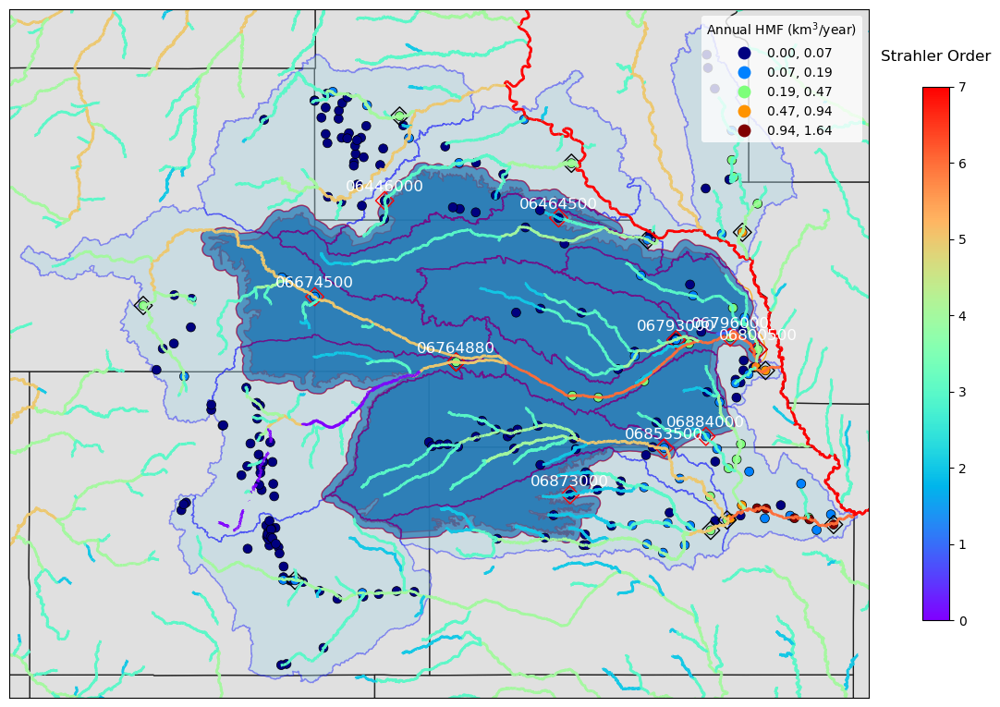

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


txg
['07337000', '08030500', '08033500', '08066500', '08068000', '08116650', '08162000', '08176500', '08211000']
9


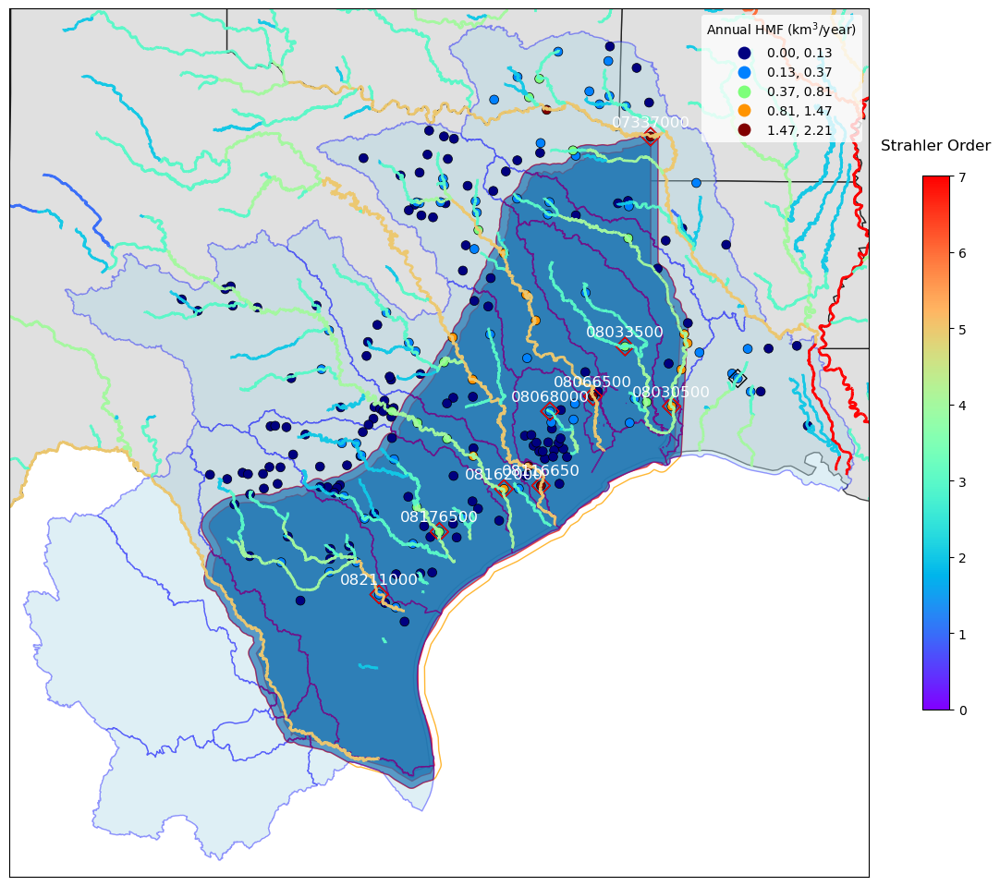

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


mr_me
['02428400', '02469761', '02477000', '02486000', '03611260', '03610200', '07022000', '07029500', '07077000', '07268000', '07362000', '07369000', '07290000', '07074500', '07337000']
15


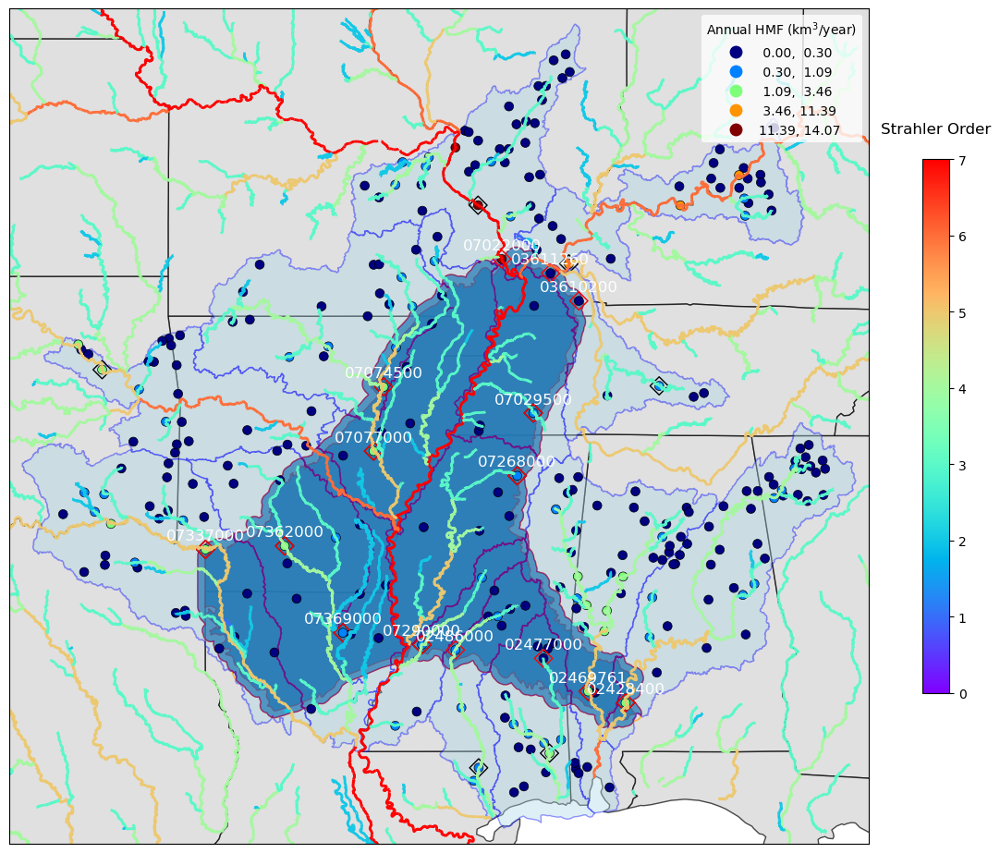

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


az
['09404343', '09390500', '09521100', '09466500', '09469500', '09502000', '09519800', '09537200']
8


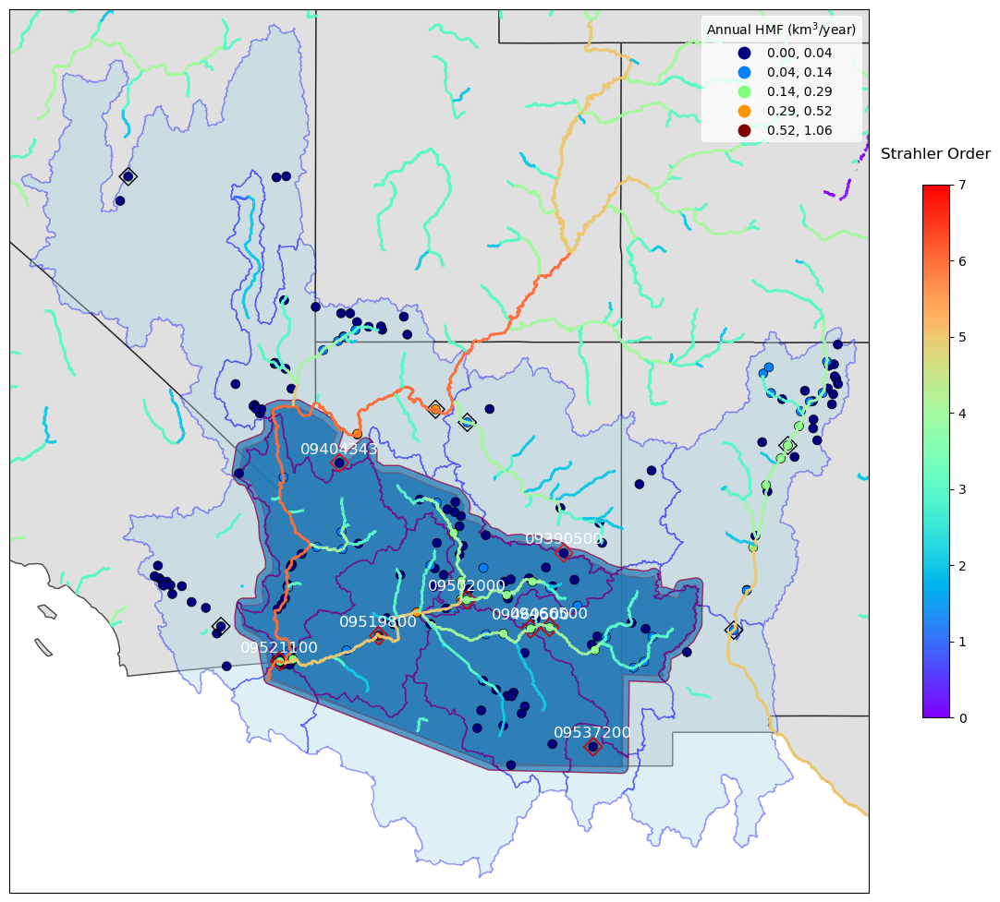

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


uc
['08284100', '09163500', '09152500', '09180500', '09217000', '09260050', '09315000', '09380000', '09355500', '09408150', '09402000', '09504420', '10020100', '10155000', '10217000', '13018300']
16


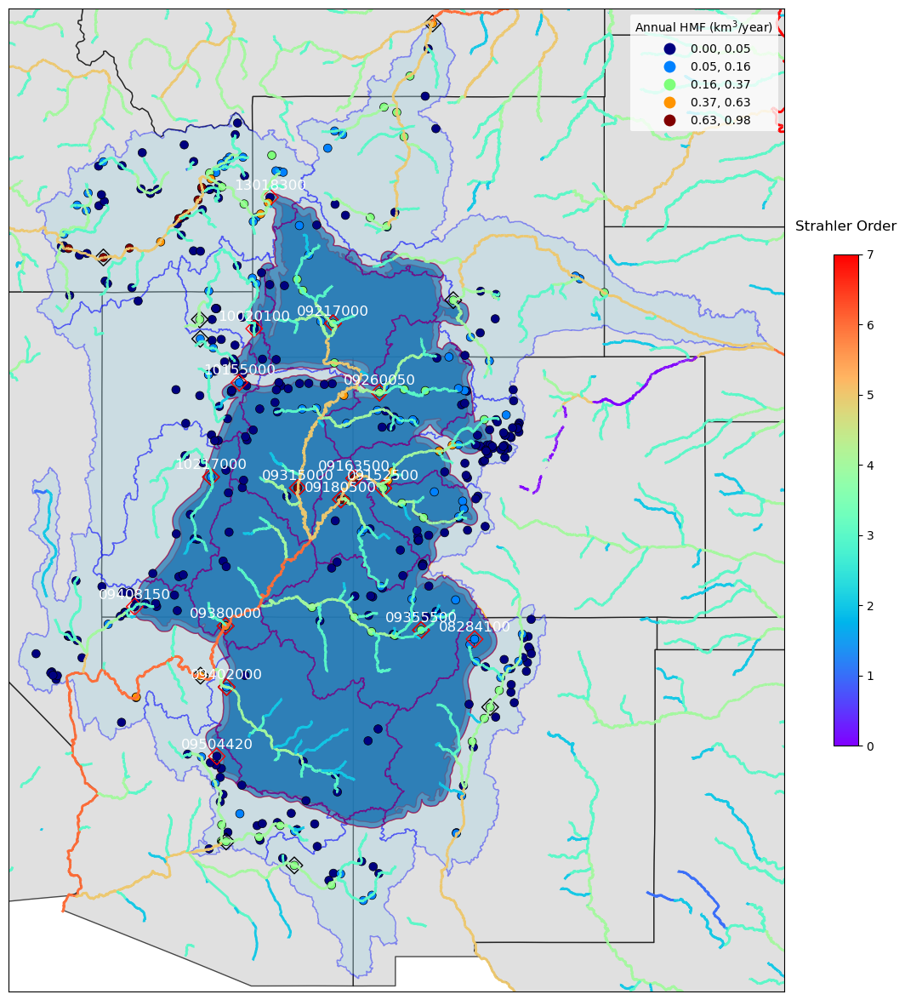

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


fl
['02105500', '02131000', '02171500', '02198500', '02226000', '02244040', '02292900', '02296750', '02320500', '02330000', '02359170']
11


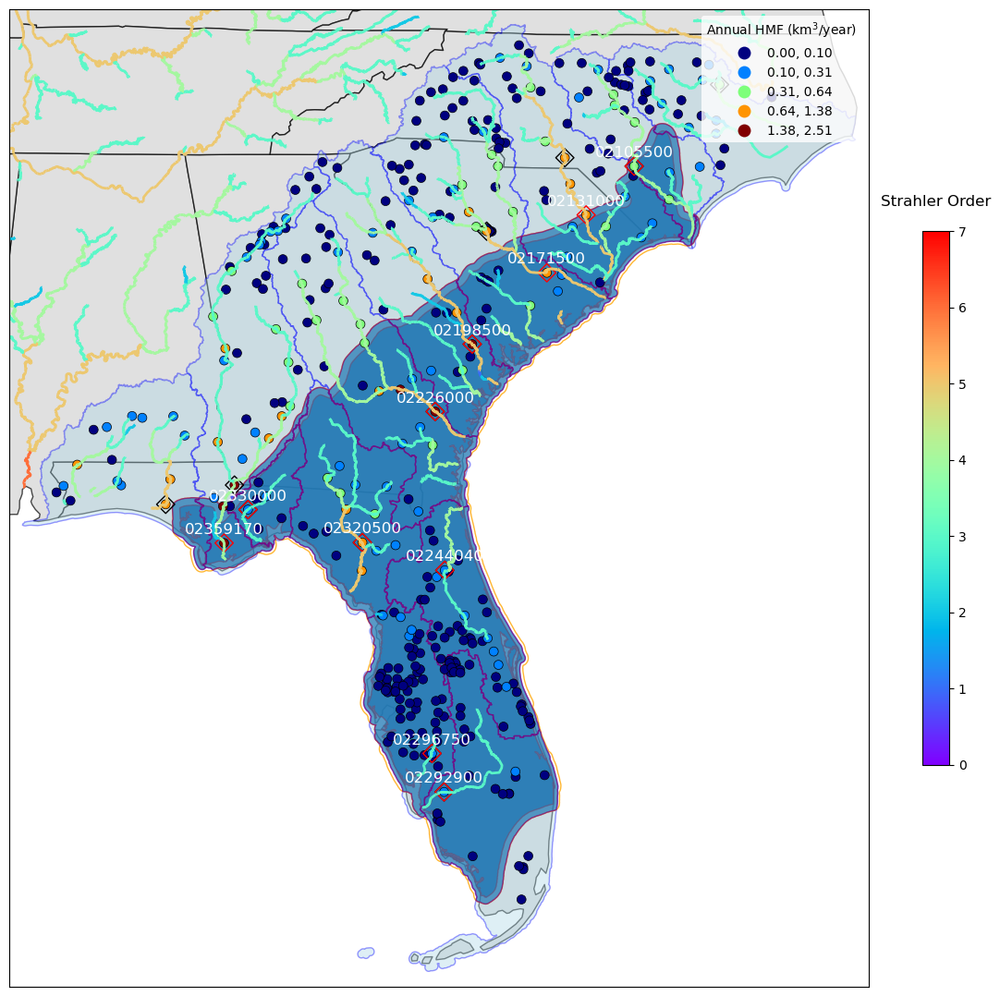

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


cv_sj
['11446500', '11189500', '11303500', '11176400']
4


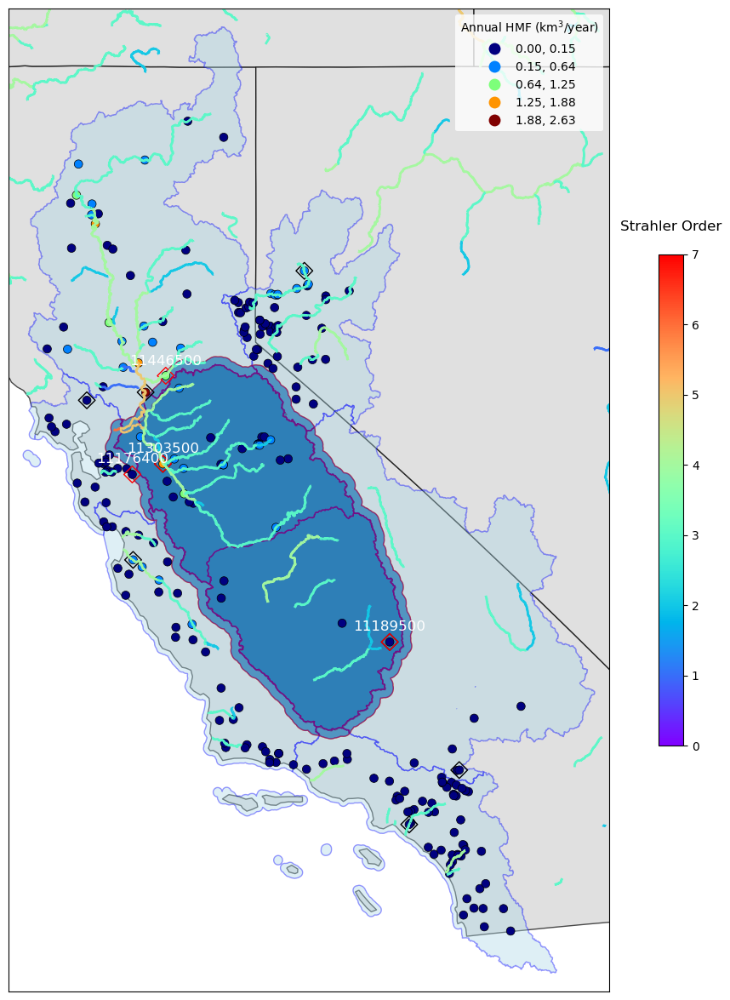

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


cv_sac
['10337500', '11463000', '11447650', '11458000']
4


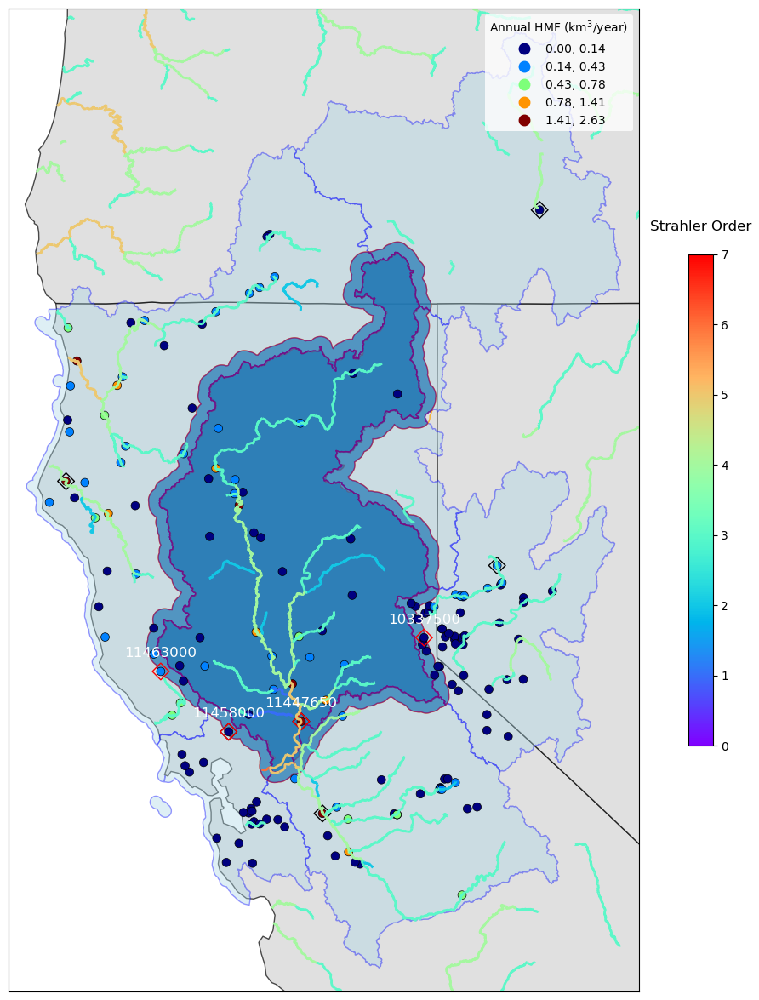

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


pen
['01543500', '02401000', '02465000', '04206000', '03049500', '03075070', '03086000', '03140500', '03198000', '03214500', '03216600', '03282000', '03404000', '03540500', '03568933', '03574500']
16


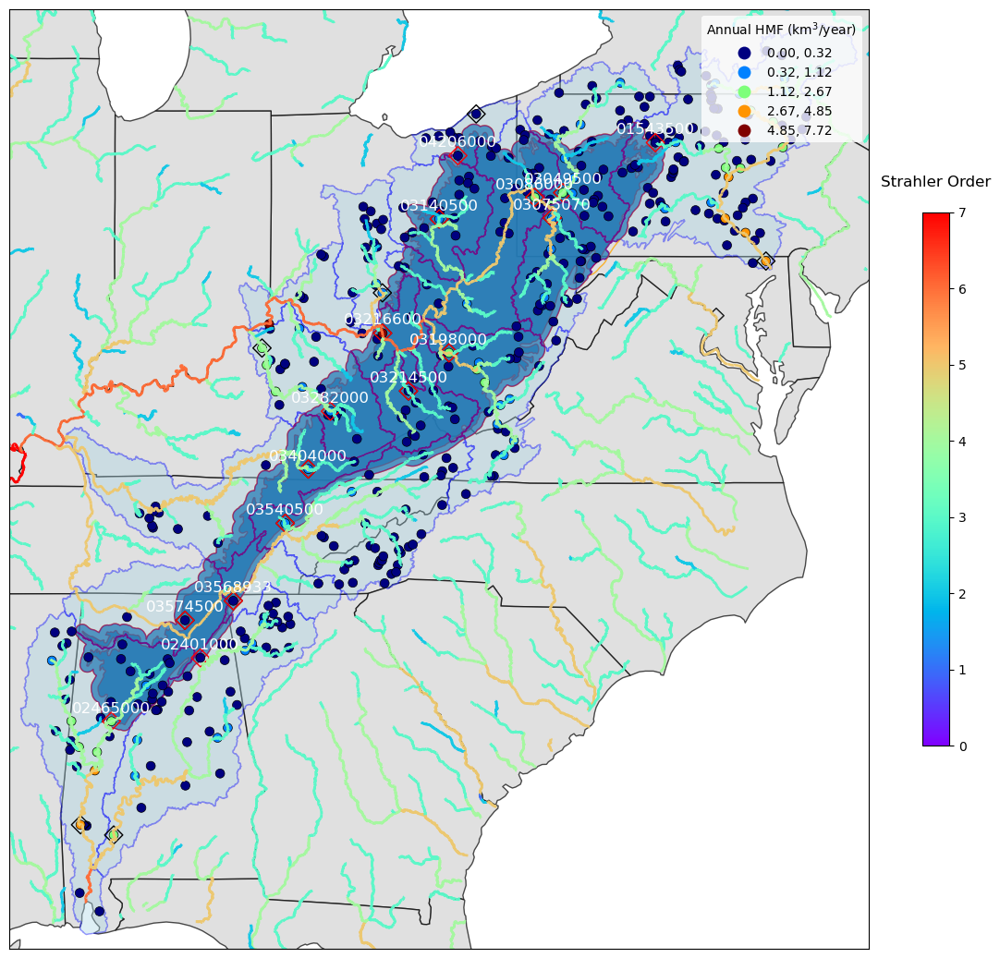

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


cl
['02375500', '02471001', '02479000', '02489500', '07373000', '07290000', '07378500', '08013500', '07375000', '08030500']
10


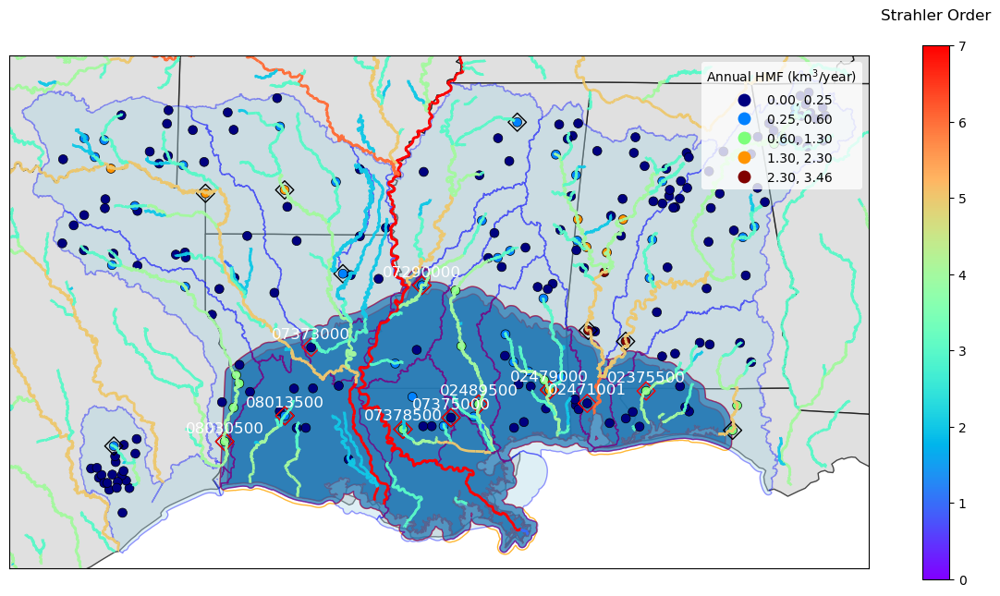

C:\Users\kondris\AppData\Local\anaconda3\envs\EPA_EAR_Project\lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


sr
['13087995', '13269000', '13334300']
3


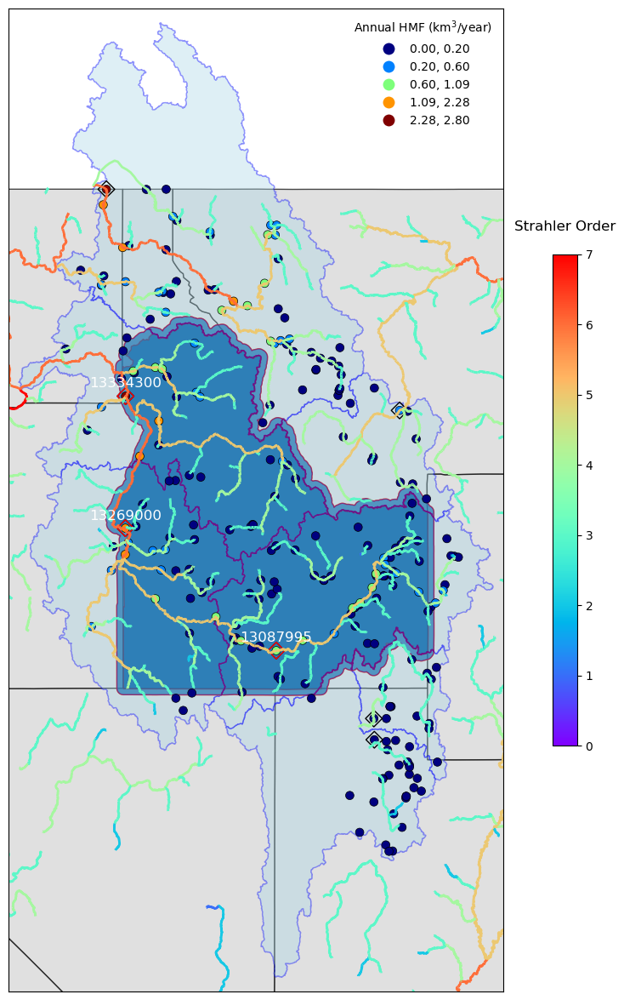

In [203]:
epsg=4269

#analysis = 'usgs'
analysis = 'rateb'

if analysis == 'usgs':
    aq_analysis = aq_names_25
    huc_dict = huc_dict_25
    aq = gpd.read_file('ShapeFiles/Aquifers_USGS_25/Aquifers_USGS_25.shp')
    #aq = aq_usgs_selected_25[aq_usgs_selected_25['AQ_NAME'] == aq_name]

elif analysis == 'rateb':
    aq_analysis = aq_names_rateb
    huc_dict = huc_dict_rateb
    aq = gpd.read_file('ShapeFiles/Aquifers_select/selected_aquifers.shp')
    aq = aq.rename(columns={'aq_name': 'AQ_NAME'})
    #aq = gdf_aq_selected[gdf_aq_selected['aq_name'] == aq_name]

def identify_outlet_gages(aq_code, aq_name, aq):
    fig, ax = plt.subplots(figsize=(15, 15))
    
    lower48 = gpd.read_file('ShapeFiles/Lower48/lower48.shp')
    lower48 = lower48.to_crs(epsg=4269)
    lower48.plot(ax=ax, edgecolor='black', facecolor='lightgrey', linewidth=1.0, alpha=0.7) 
    
    # Stream network plot
    #stream_network = stream_network.to_crs(epsg=4269)
    #stream_network.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.8, zorder=2)
    stream = gpd.read_file('ShapeFiles/Streams_US/stream_network.shp')
    stream = stream.to_crs(epsg=4269)
    stream = stream.plot(ax=ax, column='STRAHLER', cmap='rainbow', linewidth=2.0, 
                    alpha=0.98, legend=True, legend_kwds={"shrink":.5}) 
    cbar = stream.get_figure().get_axes()[-1]  # Get the colorbar axis
    cbar.set_title("Strahler Order", pad=20)  # Add a title with padding
    
    # Plot huc4s
    huc4 = gpd.read_file('ShapeFiles/_Master_HUC4/master_huc4.shx')
    huc4['huc4_code'] = huc4['huc4_code'].astype(float)
    huc4_shape_1 = huc4[huc4['huc4_code'].isin(huc_dict[aq_code])]
    huc4_shape_1.to_crs(epsg=4269)
    huc4_shape_1.plot(ax=ax, edgecolor='blue', facecolor='lightblue', linewidth=1.0, alpha=0.4)
    
    # Plot aquifers  
    aq = aq[aq['AQ_NAME'] == aq_name]
    aq.to_crs(epsg=4269)
    aq.plot(ax=ax, edgecolor='red', linewidth=1.0, alpha=0.7)

    # Plot buffer
    buffer_distance = 10000 # m
    aq_buffered = aq.to_crs(epsg=5070)
    aq_buffered['geometry'] = aq_buffered.geometry.buffer(buffer_distance)
    aq_buffered = aq_buffered.to_crs(epsg=4269)
    aq_buffered.plot(ax=ax, edgecolor='orange', facecolor='none', linewidth=1.0, alpha=0.8)
    
    # Clip huc4s to the buffered aquifer
    huc4_buffered = gpd.overlay(huc4_shape_1, aq_buffered, how='intersection')
    huc4_buffered = huc4_buffered.to_crs(epsg=4269)
    huc4_buffered.plot(ax=ax, edgecolor='purple', linewidth=1.0, alpha=0.7)
    
    # Convert geometry of all gages
    lat = df['dec_lat_va'].tolist()
    long = df['dec_long_va'].tolist()
    geometry = [Point(xy) for xy in zip(long, lat)]
    geo_pts = gpd.GeoDataFrame(geometry=geometry)
    #df = df.reset_index()
    geo_df = geo_pts.merge(df, how='left', left_index=True, right_index=True)
    
    # Select aquifer/huc and outlet gages
    geo_df = geo_df[geo_df['huc4_code'].isin(huc_dict[aq_code])] # CHANGE ME WITH AQ
    #geo_df_outlet = geo_df[geo_df['site_no'].isin(outlet_gages_dict_25[aq_code])]
    
    # Place gages into bins
    metric = 'annual_hmf'
    classifier = mc.NaturalBreaks(geo_df[metric], k=5)
    geo_df = geo_df.sort_values(metric, ascending=True)
    
    legend_frmt = {
    "title": f"{fn.FLOW_METRIC_UNITS[metric]}",
    "reverse": False,
    "loc": "upper right",
    "facecolor": "white",
    "alignment": 'center',
    "edgecolor": 'none',
    "framealpha": 0.80
    }
    
    # Set geometry for aq/huc gages
    cmap='jet' #'rainbow_r'
    geo_df = geo_df.set_geometry("geometry_x")
    geo_df.crs = "epsg:4269"
    geo_df = geo_df.to_crs(epsg=4269)
    geo_df.plot(ax=ax, column=metric, scheme='user_defined', classification_kwds={'bins': classifier.bins}, 
                cmap=cmap, legend=True, legend_kwds=legend_frmt, 
                alpha=1.0, marker='o', 
                markersize=50,
                edgecolor='black', linewidth=0.5)
    
    # Identify and plot max gage in each huc4
    huc_max = geo_df.groupby('huc4_code')[metric].idxmax()
    geo_df_max = geo_df.loc[huc_max]
    geo_df_max = huc4_shape_1.merge(geo_df_max, on='huc4_code')
    plt.scatter(geo_df_max['dec_long_va'], geo_df_max['dec_lat_va'], color='none', edgecolor='black', marker='D', s=100, alpha=1.0)
    
    # Identify and plot max gage in each buffered huc4
    #geo_df_buffer = geo_df[geo_df.geometry.within(huc4_buffered.union_all())]
    geo_df_buffer = gpd.overlay(huc4_buffered, geo_df, how='intersection', keep_geom_type=False)
    geo_df_buffer = geo_df_buffer.to_crs(epsg=4269)
    #plt.scatter(geo_df_buffer['dec_long_va'], geo_df_buffer['dec_lat_va'], color='none', edgecolor='red', marker='D', s=100, alpha=1.0)
    huc_max = geo_df_buffer.groupby('huc4_code_1')[metric].idxmax()
    geo_df_max = geo_df_buffer.loc[huc_max]
    geo_df_max = geo_df_max.drop(columns=['geometry_y'])
    geo_df_max = geo_df_max.rename(columns={'huc4_code_1': 'huc4_code'})
    geo_df_max = huc4_shape_1.merge(geo_df_max, on='huc4_code')
    plt.scatter(geo_df_max['dec_long_va'], geo_df_max['dec_lat_va'], color='none', edgecolor='red', marker='D', s=100, alpha=1.0)
    
    offset = 0.12
    site_list = []
    for i, site_no in enumerate(geo_df_max['site_no']):
        plt.annotate(site_no, (geo_df_max['dec_long_va'].iloc[i], geo_df_max['dec_lat_va'].iloc[i] + offset), fontsize=12, alpha=1.0, color='white', ha='center',)
                    #bbox=dict(facecolor='navy', alpha=0.5))
        site_list.append(str(site_no))
    
    xmin, xmax, ymin, ymax = fn.set_plot_bounds(huc4_shape_1, padding=0.20)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_yticks([])
    ax.set_xticks([])
    
    img_path = f'Saved_Visuals/Aquifers/outlet_gages/huc4_buffer/{aquifer_name}_30_90_gages.png'
    #fn.save_plot_as_image(img_path, overwrite) 
    
    print(aq_code)
    print(site_list)
    print(len(site_list))
    
    plt.show()

for aq_code, aq_name in aq_analysis.items():
    identify_outlet_gages(aq_code, aq_name, aq)

# Calculate area of aquifers and huc4s

In [105]:
aq_usgs_selected_25_area = aq_usgs_selected_25.to_crs(epsg=6933) #32633 #3857
aq_usgs_selected_25_area['aq_area_km2'] = aq_usgs_selected_25_area.area / 10**6
aq_usgs_selected_25_area = aq_usgs_selected_25_area[['AQ_NAME', 'aq_area_km2']]

In [106]:
aq_usgs_selected_25_area

,AQ_NAME,aq_area_km2
0,Basin and Range basin-fill aquifers,381862.726157
1,Biscayne aquifer,9254.628428
2,California Coastal Basin aquifers,26419.840896
3,Cambrian-Ordovician aquifer system,120622.619824
4,Central Valley aquifer system,52592.314018
5,Coastal lowlands aquifer system,256119.835534
6,Columbia Plateau basaltic-rock aquifers,75096.242100
7,Edwards-Trinity aquifer system,124581.652833
8,Floridan aquifer system,40002.190770
9,High Plains aquifer,457009.110174


In [92]:
huc4_aq_area = {}
for aq_code, aq_name in aq_names_25.items():  
    huc4_shape_1 = huc4[huc4['huc4_code'].isin(huc_dict_25[aq_code])]
    huc4_shape_1 = huc4_shape_1.to_crs(epsg=6933)
    huc4_shape_1['area'] = huc4_shape_1.area / 10**6
    huc4_shape_1_area = huc4_shape_1['area'].sum()
    huc4_aq_area[aq_name] = huc4_shape_1_area

In [103]:
huc4_aq_area_df = pd.DataFrame.from_dict(huc4_aq_area, orient='index', columns=['huc4_area_km2'])
huc4_aq_area_df = huc4_aq_area_df.sort_index(ascending=True).reset_index(names='AQ_NAME')

In [104]:
huc4_aq_area_df

,AQ_NAME,huc4_area_km2
0,Basin and Range basin-fill aquifers,1.176662e+06
1,Biscayne aquifer,5.238817e+04
2,California Coastal Basin aquifers,3.515648e+05
3,Cambrian-Ordovician aquifer system,6.861674e+05
4,Central Valley aquifer system,1.554967e+05
5,Coastal lowlands aquifer system,9.199006e+05
6,Columbia Plateau basaltic-rock aquifers,5.344490e+05
7,Edwards-Trinity aquifer system,7.234771e+05
8,Floridan aquifer system,1.993260e+05
9,High Plains aquifer,1.178525e+06


In [109]:
aq_area_df = pd.merge(aq_usgs_selected_25_area, huc4_aq_area_df, on='AQ_NAME')
file_name = 'Tables/area_aq_huc4_km2.xlsx'
aq_area_df.to_excel(file_name, index=False)

aq_area_df

,AQ_NAME,aq_area_km2,huc4_area_km2
0,Basin and Range basin-fill aquifers,381862.726157,1.176662e+06
1,Biscayne aquifer,9254.628428,5.238817e+04
2,California Coastal Basin aquifers,26419.840896,3.515648e+05
3,Cambrian-Ordovician aquifer system,120622.619824,6.861674e+05
4,Central Valley aquifer system,52592.314018,1.554967e+05
5,Coastal lowlands aquifer system,256119.835534,9.199006e+05
6,Columbia Plateau basaltic-rock aquifers,75096.242100,5.344490e+05
7,Edwards-Trinity aquifer system,124581.652833,7.234771e+05
8,Floridan aquifer system,40002.190770,1.993260e+05
9,High Plains aquifer,457009.110174,1.178525e+06


In [110]:
aq_shape.loc[aq_shape['aq_name'] == 'Arizona_Alluvial', 'aq_name'] = 'Arizona Alluvial'
aq_shape.loc[aq_shape['aq_name'] == 'Texas_Gulf_Coast', 'aq_name'] = 'Texas Gulf Coast'
aq_shape.loc[aq_shape['aq_name'] == 'Coastal_Lowlands', 'aq_name'] = 'Coastal Lowlands'
row_to_add = aq_shape.iloc[[0]]
aq_usgs_selected_25_new = gpd.GeoDataFrame(pd.concat([aq_usgs_selected_25, row_to_add], ignore_index=True))
row_to_add = aq_shape.iloc[[2]]
aq_usgs_selected_25_new = gpd.GeoDataFrame(pd.concat([aq_usgs_selected_25_new, row_to_add], ignore_index=True))
row_to_add = aq_shape.iloc[[15]]
aq_usgs_selected_25_new = gpd.GeoDataFrame(pd.concat([aq_usgs_selected_25_new, row_to_add], ignore_index=True))
aq_usgs_selected_25_new.loc[25, 'AQ_NAME'] = 'Arizona Alluvial'
aq_usgs_selected_25_new.loc[26, 'AQ_NAME'] = 'Texas Gulf Coast'
aq_usgs_selected_25_new.loc[27, 'AQ_NAME'] = 'Coastal Lowlands'